## Case Study - Banking Domain

#### SPRINT 1 - EDA
Task - Exploratory Data Analysis

Step 1: Explore Data Distribution of Each Column

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv(r"C:\Users\NIKHIL\Downloads\creditRisk.csv")

In [6]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [7]:
df.shape

(32581, 12)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [9]:
df.isna().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [10]:
df.isna().sum()/df.shape[0]*100

person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
person_emp_length             2.747000
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_int_rate                 9.563856
loan_status                   0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
dtype: float64

In [11]:
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [12]:
df.describe(include = "object")

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
count,32581,32581,32581,32581
unique,4,6,7,2
top,RENT,EDUCATION,A,N
freq,16446,6453,10777,26836


In [13]:
df["person_home_ownership"].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER'], dtype=object)

In [14]:
df["person_home_ownership"].value_counts()

person_home_ownership
RENT        16446
MORTGAGE    13444
OWN          2584
OTHER         107
Name: count, dtype: int64

In [15]:
df["person_home_ownership"].value_counts(normalize = True)*100

person_home_ownership
RENT        50.477272
MORTGAGE    41.263313
OWN          7.931003
OTHER        0.328412
Name: proportion, dtype: float64

In [16]:
df["loan_intent"].unique()

array(['PERSONAL', 'EDUCATION', 'MEDICAL', 'VENTURE', 'HOMEIMPROVEMENT',
       'DEBTCONSOLIDATION'], dtype=object)

In [17]:
df["loan_intent"].value_counts(normalize = True)*100

loan_intent
EDUCATION            19.806022
MEDICAL              18.633559
VENTURE              17.553175
PERSONAL             16.945459
DEBTCONSOLIDATION    15.997053
HOMEIMPROVEMENT      11.064731
Name: proportion, dtype: float64

In [18]:
df["loan_grade"].unique()

array(['D', 'B', 'C', 'A', 'E', 'F', 'G'], dtype=object)

In [19]:
df["loan_grade"].value_counts(normalize = True)*100

loan_grade
A    33.077561
B    32.076977
C    19.821368
D    11.129186
E     2.958780
F     0.739695
G     0.196434
Name: proportion, dtype: float64

In [20]:
df["person_age"].describe()

count    32581.000000
mean        27.734600
std          6.348078
min         20.000000
25%         23.000000
50%         26.000000
75%         30.000000
max        144.000000
Name: person_age, dtype: float64

<Axes: ylabel='Frequency'>

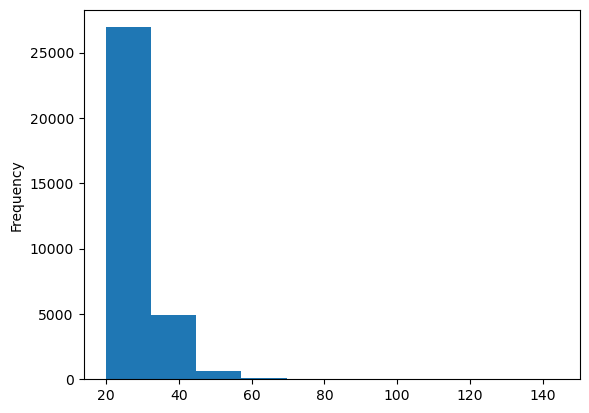

In [21]:
#Distribution

df["person_age"].plot(kind = "hist")

<Axes: ylabel='Density'>

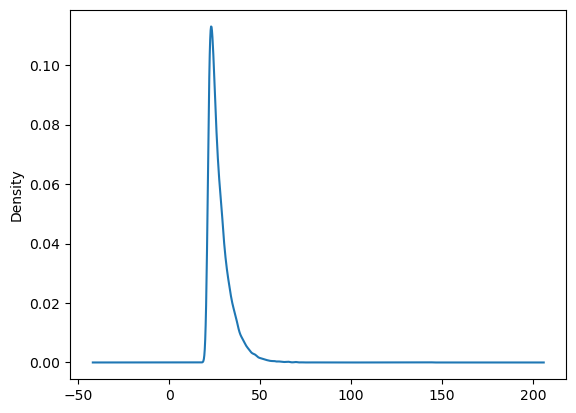

In [22]:
df["person_age"].plot(kind = "kde")

<Axes: >

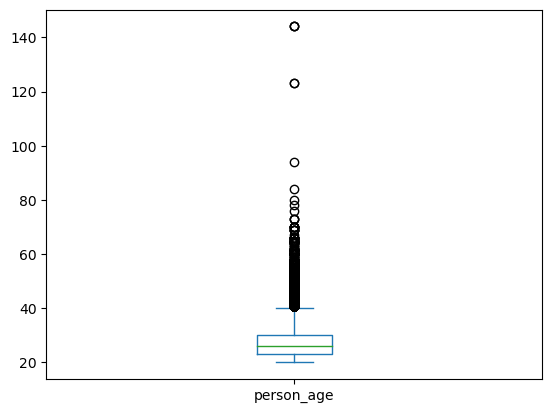

In [23]:
df["person_age"].plot(kind = "box")

In [24]:
#To find how many outliers are there
q1 = df["person_age"].quantile(0.25)
q3 = df["person_age"].quantile(0.75)

IQR = q3 - q1
lower_val = q1 - 1.5*IQR
upper_val = q3 + 1.5*IQR
outliers_age = df[(df["person_age"] < lower_val) | (df["person_age"] > upper_val)]

In [25]:
outliers_age.shape[0]/df.shape[0]*100      #5% of data in age column are outliers

4.585494613425002

<Axes: ylabel='Frequency'>

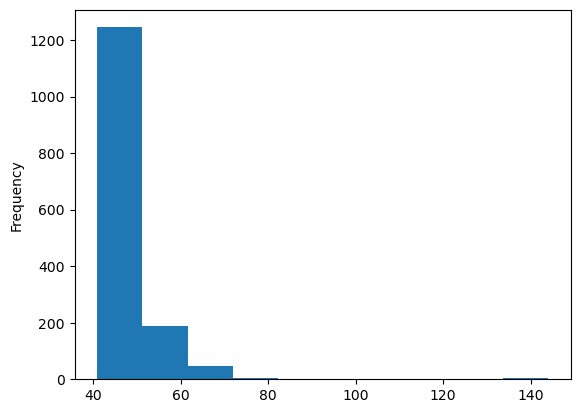

In [26]:
outliers_age["person_age"].plot(kind = "hist")

In [27]:
#Dropping the age greater than 100
outliers_age[outliers_age["person_age"] > 100]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
81,144,250000,RENT,4.0,VENTURE,C,4800,13.57,0,0.02,N,3
183,144,200000,MORTGAGE,4.0,EDUCATION,B,6000,11.86,0,0.03,N,2
575,123,80004,RENT,2.0,EDUCATION,B,20400,10.25,0,0.25,N,3
747,123,78000,RENT,7.0,VENTURE,B,20000,NaN,0,0.26,N,4
32297,144,6000000,MORTGAGE,12.0,PERSONAL,C,5000,12.73,0,0.00,N,25


In [28]:
outliers_age[outliers_age["person_age"] > 100].index

Index([81, 183, 575, 747, 32297], dtype='int64')

In [29]:
df.drop(index = [81, 183, 575, 747, 32297], inplace = True)

In [30]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


<Axes: ylabel='Frequency'>

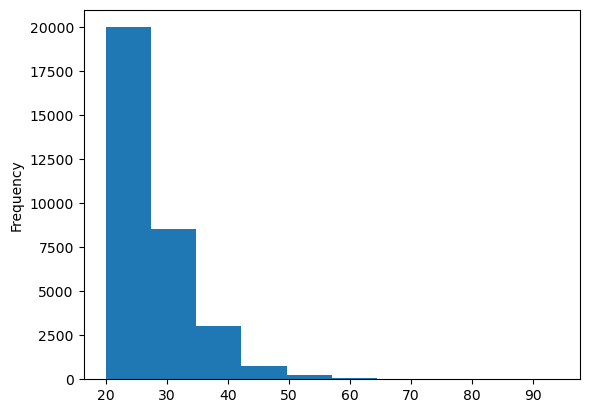

In [31]:
df["person_age"].plot(kind = "hist")

<Axes: ylabel='Frequency'>

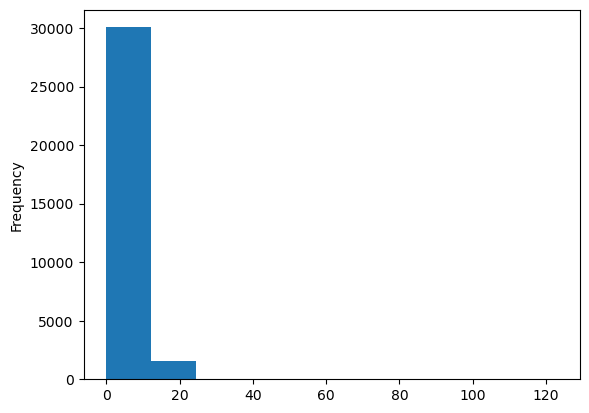

In [32]:
df["person_emp_length"].plot(kind = "hist")

<Axes: >

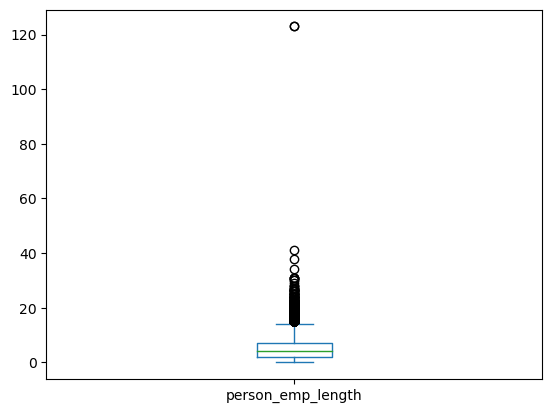

In [33]:
df["person_emp_length"].plot(kind = "box")

In [34]:
q1 = df["person_emp_length"].quantile(0.25)
q3 = df["person_emp_length"].quantile(0.75)

IQR = q3 - q1
lower_val = q1 - 1.5*IQR
upper_val = q3 + 1.5*IQR

outliers_emp_length = df[(df["person_emp_length"] < lower_val) | (df["person_emp_length"] > upper_val)]

In [35]:
outliers_emp_length

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
210,21,192000,MORTGAGE,123.0,VENTURE,A,20000,6.54,0,0.10,N,4
17834,34,948000,MORTGAGE,18.0,PERSONAL,B,2000,9.99,0,0.00,N,7
17847,35,500000,MORTGAGE,17.0,DEBTCONSOLIDATION,C,20000,13.85,0,0.04,Y,7
17850,34,120000,RENT,17.0,VENTURE,B,35000,10.59,0,0.29,N,6
...,...,...,...,...,...,...,...,...,...,...,...,...
32516,52,29000,OWN,23.0,PERSONAL,A,7000,7.49,0,0.24,N,20
32519,51,115900,MORTGAGE,16.0,PERSONAL,A,12000,7.88,0,0.10,N,29
32534,76,75000,RENT,23.0,MEDICAL,A,15000,8.94,0,0.20,N,25
32539,61,148000,MORTGAGE,30.0,DEBTCONSOLIDATION,B,24000,10.38,1,0.16,N,20


In [36]:
#dropping the persons employ length which is greater than 60 years
outliers_emp_length[outliers_emp_length["person_emp_length"] > 60]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
210,21,192000,MORTGAGE,123.0,VENTURE,A,20000,6.54,0,0.10,N,4


In [37]:
outliers_emp_length[outliers_emp_length["person_emp_length"] > 60].index

Index([0, 210], dtype='int64')

In [38]:
df.drop(index = [0, 210],inplace = True)

In [39]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [40]:
#Taking numerical columns by excluding the object datatype and including the int and float datatypes which presents the data in numerical
df.select_dtypes(exclude = "object")

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
1,21,9600,5.0,1000,11.14,0,0.10,2
2,25,9600,1.0,5500,12.87,1,0.57,3
3,23,65500,4.0,35000,15.23,1,0.53,2
4,24,54400,8.0,35000,14.27,1,0.55,4
5,21,9900,2.0,2500,7.14,1,0.25,2
...,...,...,...,...,...,...,...,...
32576,57,53000,1.0,5800,13.16,0,0.11,30
32577,54,120000,4.0,17625,7.49,0,0.15,19
32578,65,76000,3.0,35000,10.99,1,0.46,28
32579,56,150000,5.0,15000,11.48,0,0.10,26


In [41]:
num_col = df.select_dtypes(exclude = "object").columns

In [42]:
num_col

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

(array([1.9965e+04, 8.5280e+03, 3.0210e+03, 7.2500e+02, 2.1600e+02,
        8.0000e+01, 3.1000e+01, 5.0000e+00, 2.0000e+00, 1.0000e+00]),
 array([20. , 27.4, 34.8, 42.2, 49.6, 57. , 64.4, 71.8, 79.2, 86.6, 94. ]),
 <BarContainer object of 10 artists>)

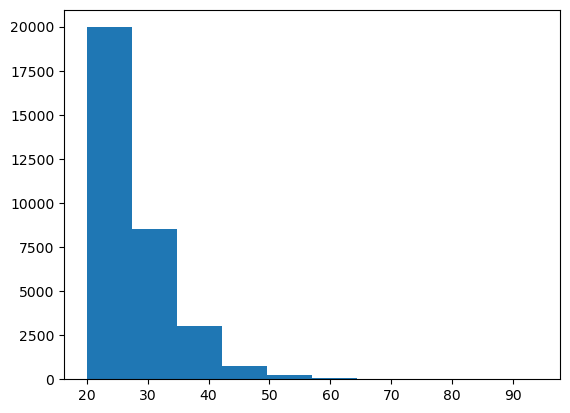

In [43]:
plt.hist(df["person_age"])

In [44]:
def distribution(columns):
    for i in columns:
        plt.figure(figsize = (10,6))
        plt.hist(df[i])
        plt.title(f"The Distribution of {i}")
        plt.show()

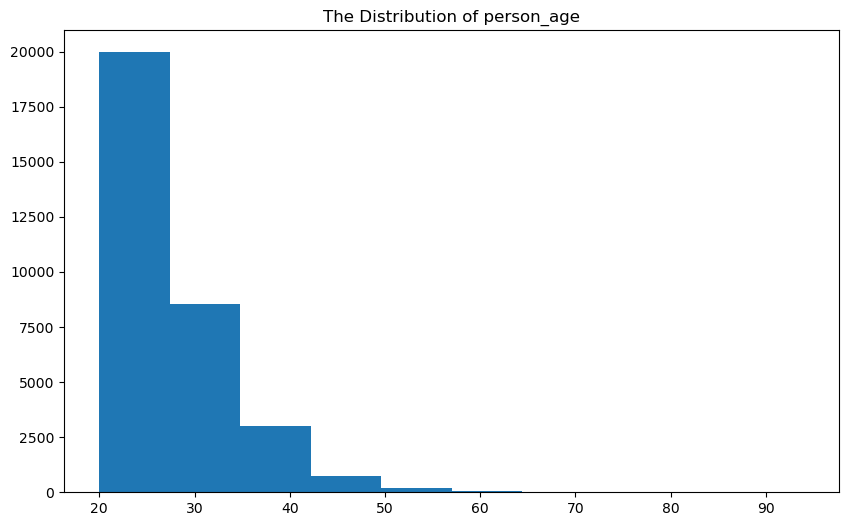

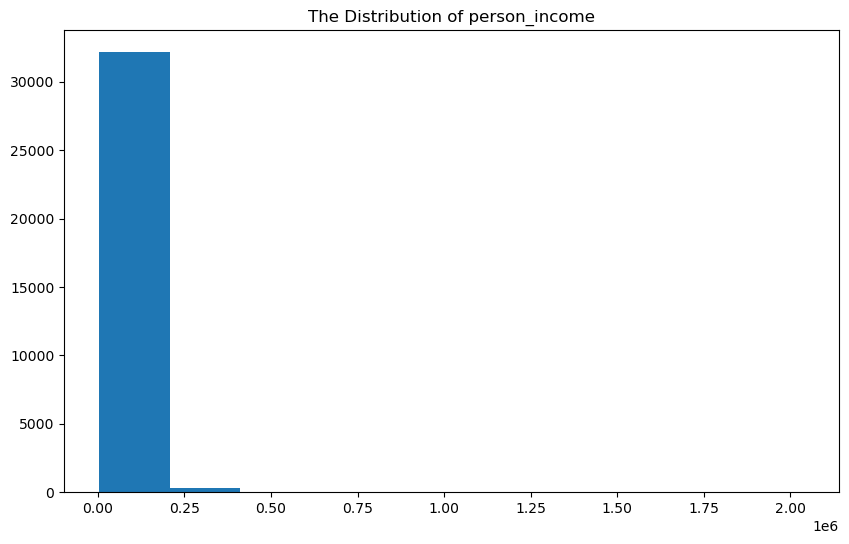

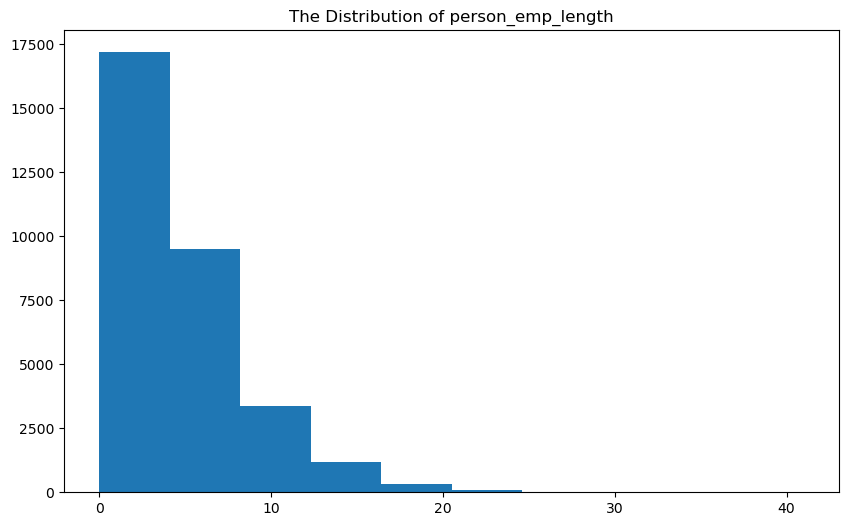

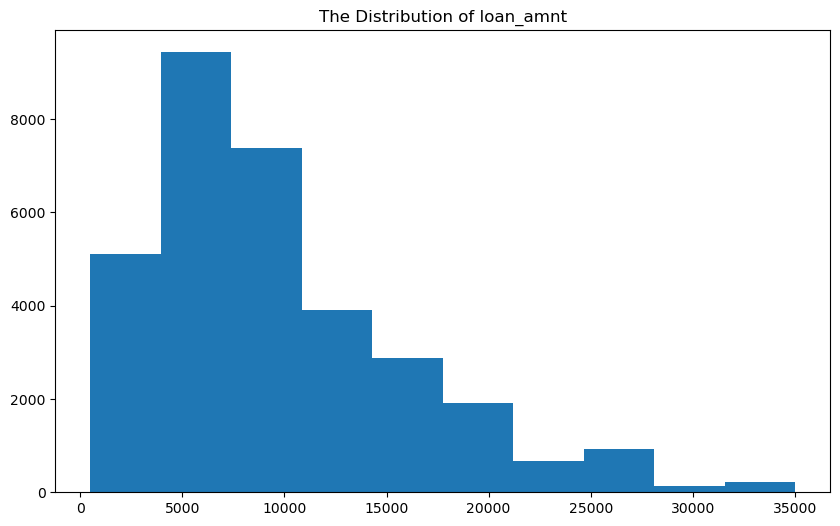

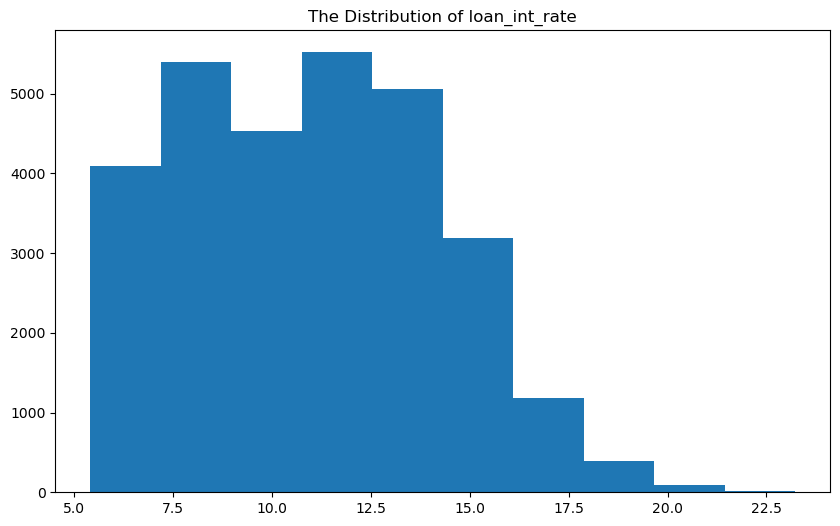

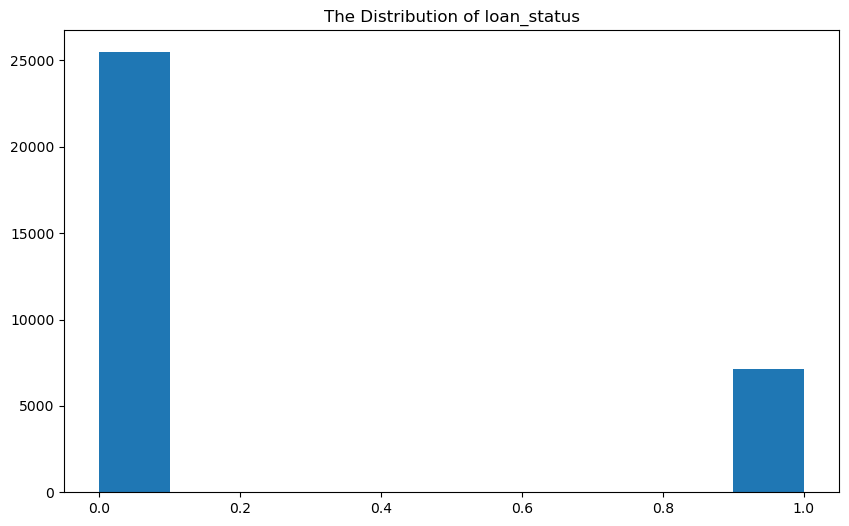

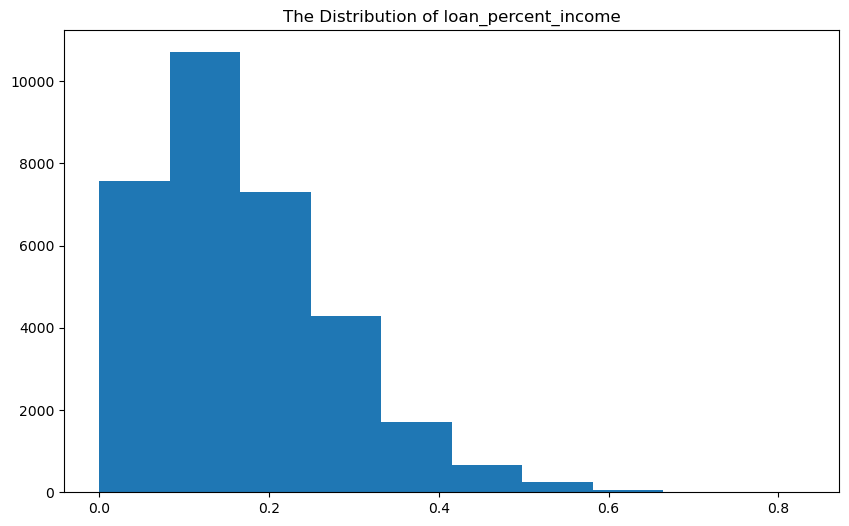

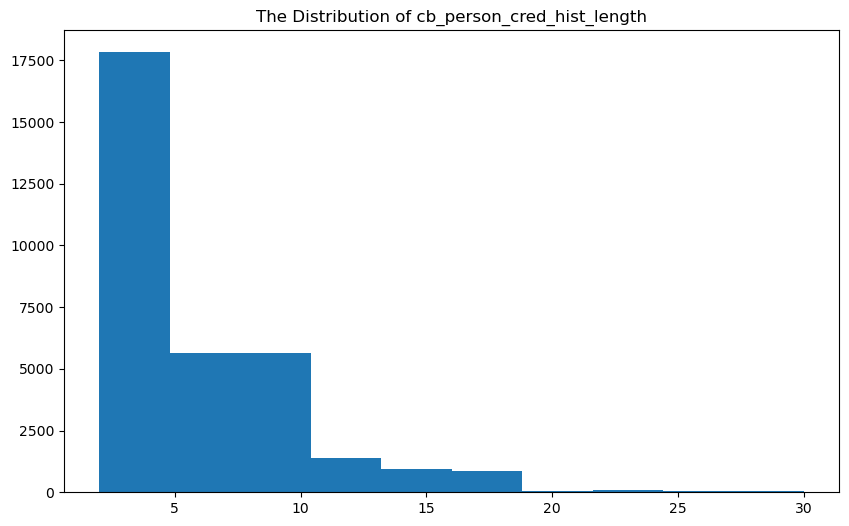

In [45]:
distribution(num_col)

In [46]:
df["person_income"]

1          9600
2          9600
3         65500
4         54400
5          9900
          ...  
32576     53000
32577    120000
32578     76000
32579    150000
32580     42000
Name: person_income, Length: 32574, dtype: int64

In [47]:
round(df["person_income"].describe())

count      32574.0
mean       65878.0
std        52532.0
min         4000.0
25%        38500.0
50%        55000.0
75%        79200.0
max      2039784.0
Name: person_income, dtype: float64

<Axes: >

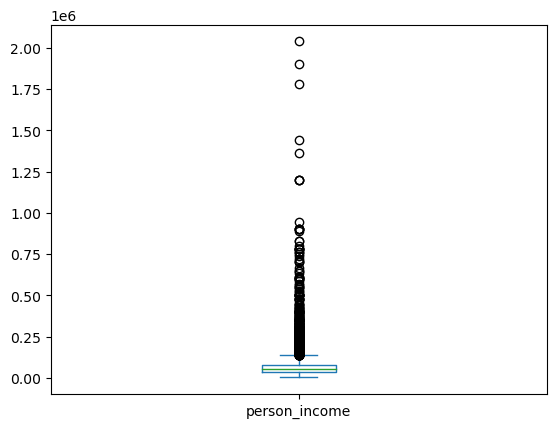

In [48]:
df["person_income"].plot(kind = "box")

In [49]:
q1 = df["person_income"].quantile(0.25)
q3 = df["person_income"].quantile(0.75)

IQR = q3 - q1
lower_val = q1 - 1.5*IQR
upper_val = q3 + 1.5*IQR

outliers_person_income = df[(df["person_income"] < lower_val) | (df["person_income"] > upper_val)]

In [50]:
outliers_person_income

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
15,23,500000,MORTGAGE,7.0,DEBTCONSOLIDATION,B,30000,10.65,0,0.06,N,3
20,25,162500,RENT,2.0,VENTURE,A,35000,7.49,0,0.22,N,4
33,25,306000,RENT,2.0,DEBTCONSOLIDATION,C,24250,13.85,0,0.08,N,3
34,26,300000,MORTGAGE,10.0,MEDICAL,C,7800,13.49,0,0.03,N,4
42,26,300000,MORTGAGE,10.0,VENTURE,A,20000,7.88,0,0.07,N,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32544,58,780000,MORTGAGE,7.0,PERSONAL,A,4500,6.91,0,0.01,N,20
32546,60,1900000,MORTGAGE,5.0,PERSONAL,A,1500,NaN,0,0.00,N,21
32551,58,780000,MORTGAGE,7.0,PERSONAL,A,4500,6.91,0,0.01,N,19
32562,61,160000,MORTGAGE,30.0,PERSONAL,B,24000,10.38,0,0.15,N,21


<Axes: ylabel='Frequency'>

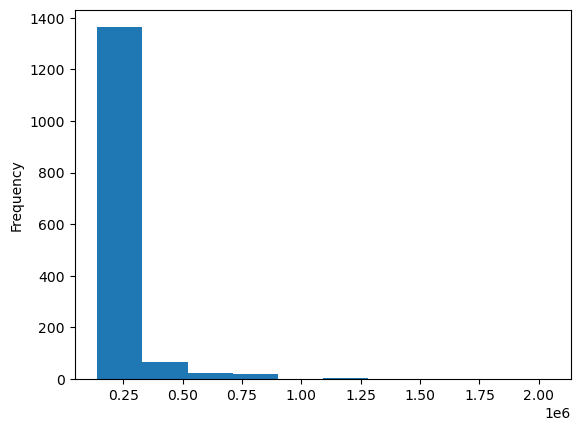

In [51]:
outliers_person_income["person_income"].plot(kind = "hist")

In [52]:
outliers_person_income[outliers_person_income["person_income"] > 1500000]
#Not dropping the data due to valid relation between age,income and employ length

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
30049,42,2039784,RENT,0.0,VENTURE,C,8450,12.29,0,0.00,Y,15
32497,63,1782000,RENT,13.0,EDUCATION,C,12025,14.27,0,0.01,N,30
32546,60,1900000,MORTGAGE,5.0,PERSONAL,A,1500,NaN,0,0.00,N,21


In [53]:
#Taking categorial columns with respectively including the object datatype
df.select_dtypes(include = "object")

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
1,OWN,EDUCATION,B,N
2,MORTGAGE,MEDICAL,C,N
3,RENT,MEDICAL,C,N
4,RENT,MEDICAL,C,Y
5,OWN,VENTURE,A,N
...,...,...,...,...
32576,MORTGAGE,PERSONAL,C,N
32577,MORTGAGE,PERSONAL,A,N
32578,RENT,HOMEIMPROVEMENT,B,N
32579,MORTGAGE,PERSONAL,B,N


In [54]:
cat_col = df.select_dtypes(include = "object").columns

In [55]:
cat_col

Index(['person_home_ownership', 'loan_intent', 'loan_grade',
       'cb_person_default_on_file'],
      dtype='object')

In [56]:
df["loan_intent"].value_counts().values

array([6451, 6071, 5716, 5519, 5212, 3605], dtype=int64)

<Axes: xlabel='loan_intent', ylabel='count'>

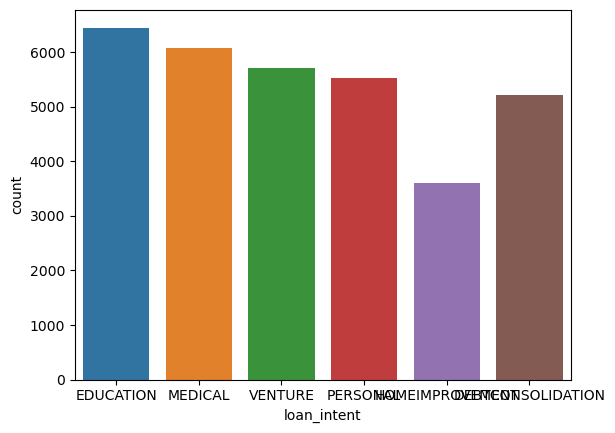

In [57]:
sns.countplot(data = df, x = "loan_intent")

In [58]:
def frequency(columns):
    for i in columns:       
        plt.figure(figsize = (10,6))
        sns.countplot(data = df, x = i)
        plt.title(f"The frequency of {i}")
        plt.xticks(rotation = 90)
        plt.show()

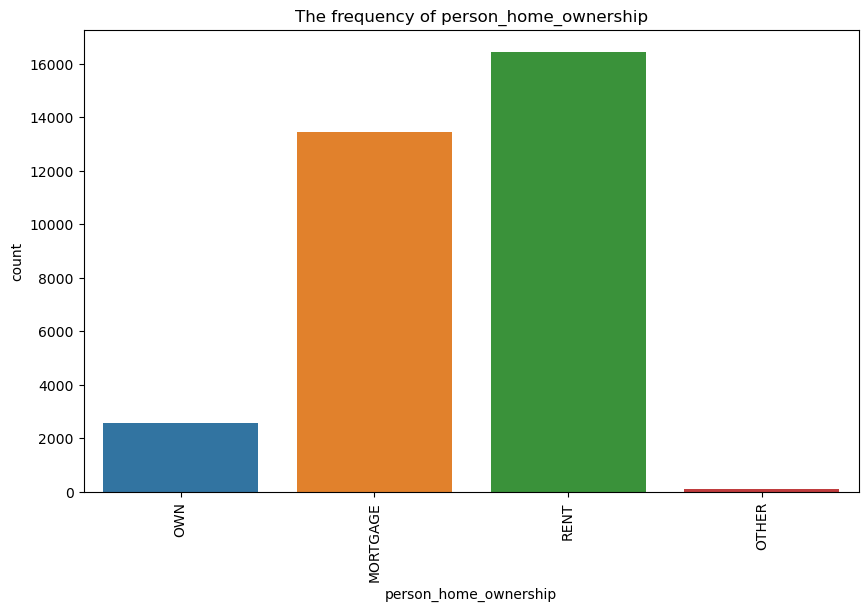

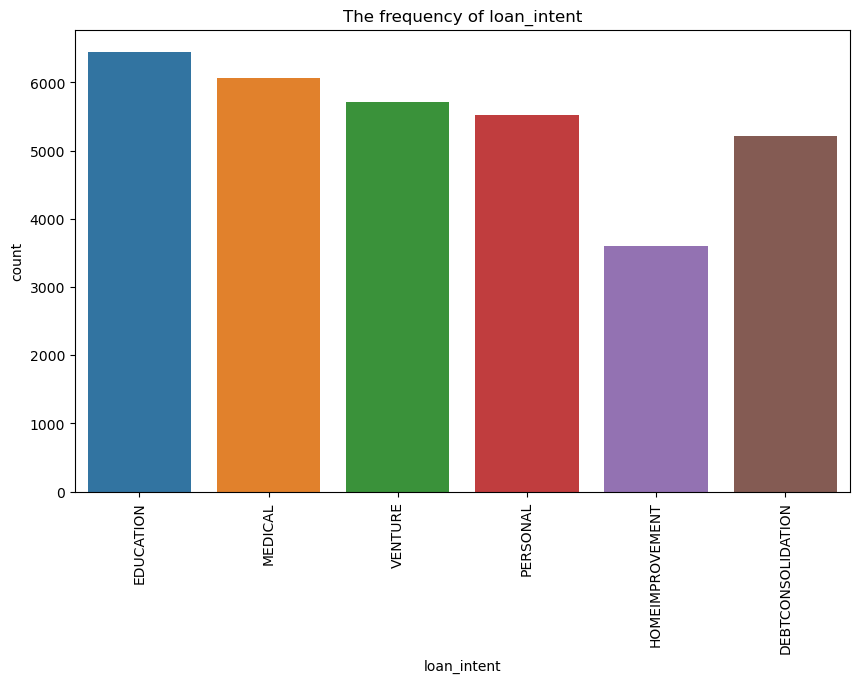

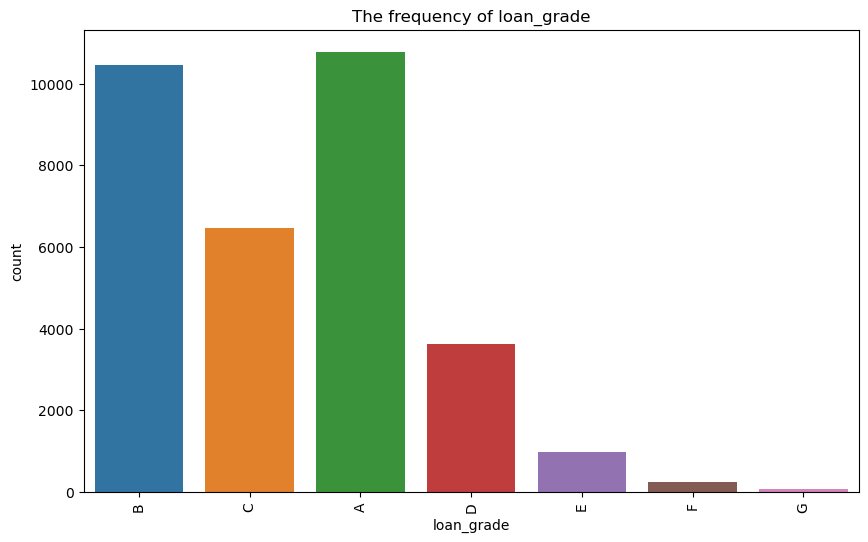

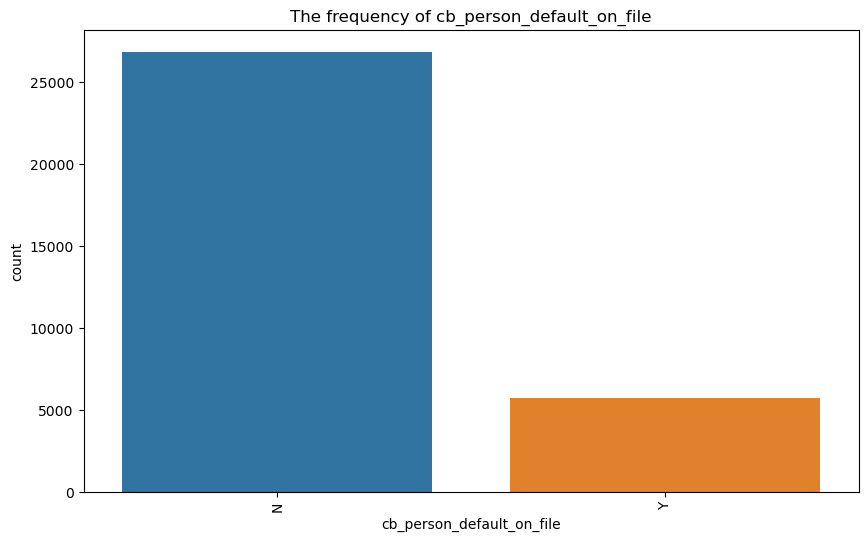

In [59]:
frequency(cat_col)

In [60]:
num_col

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

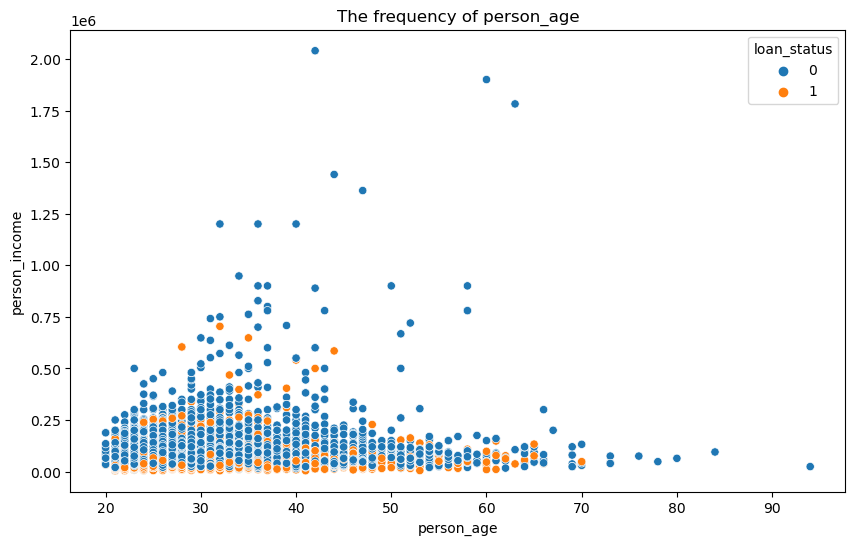

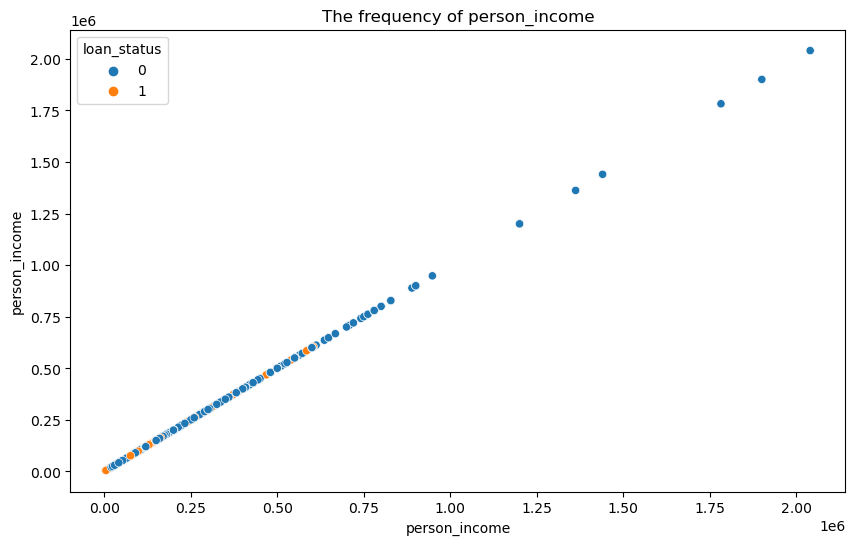

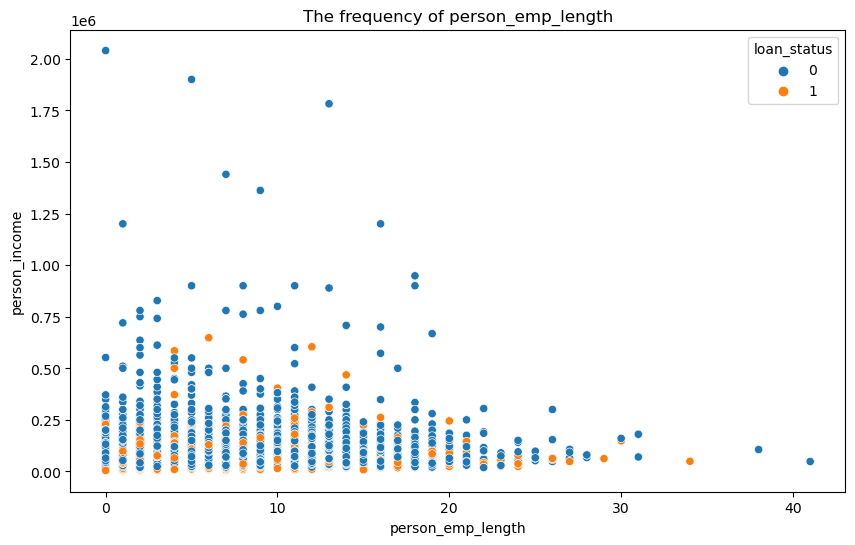

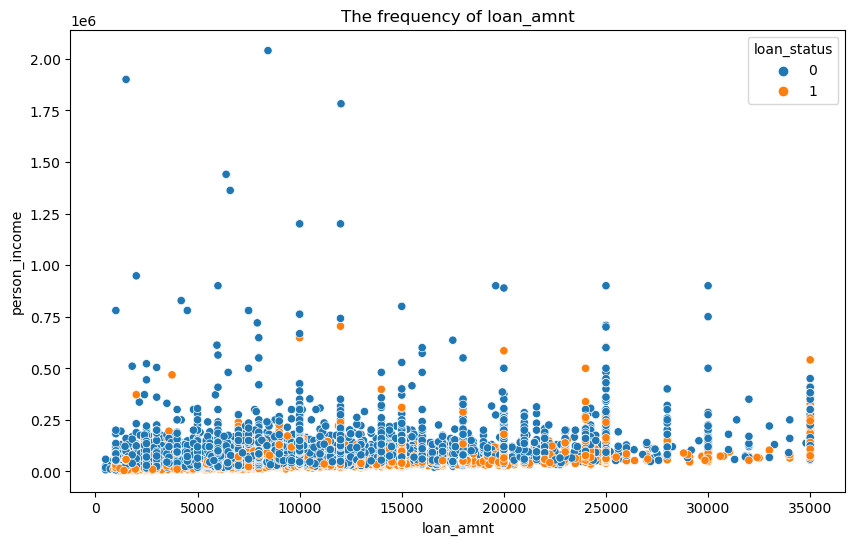

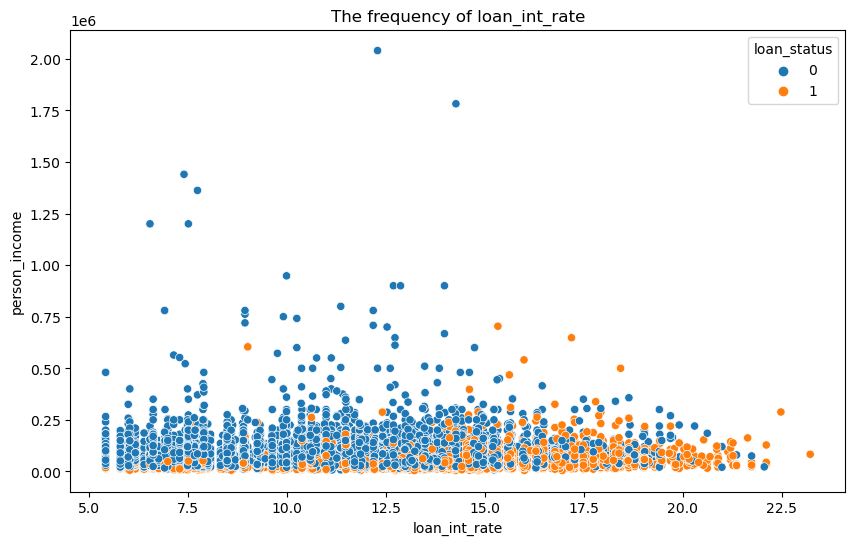

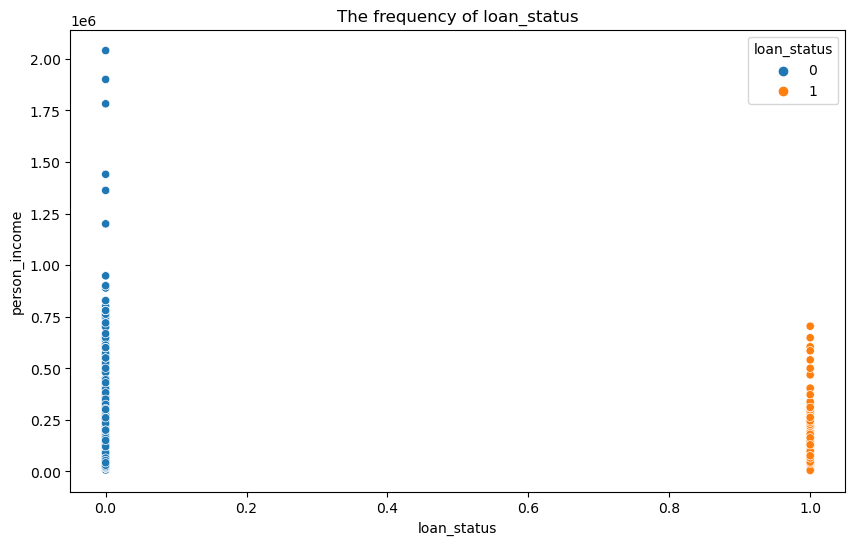

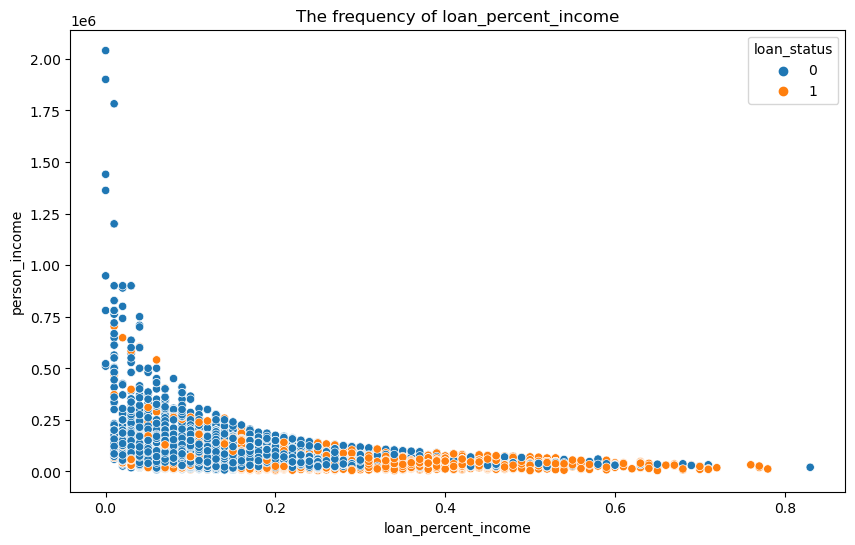

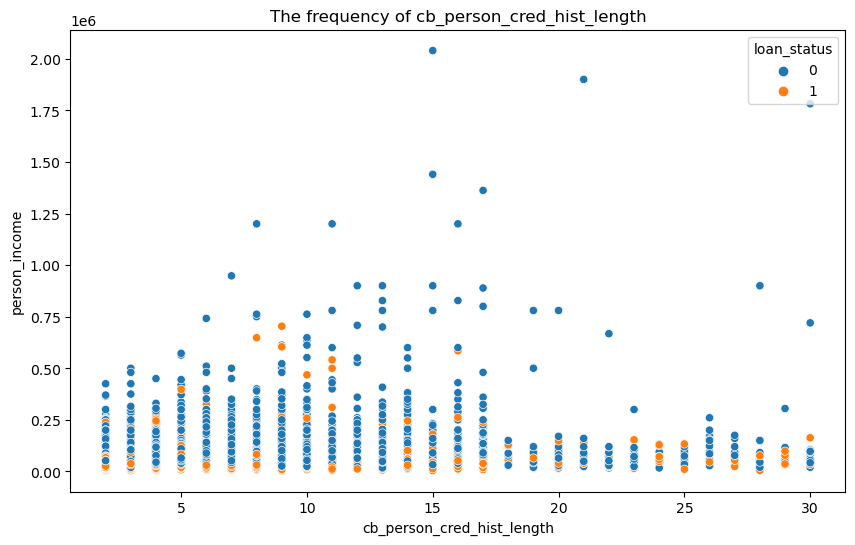

In [61]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "person_income", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

In [62]:
#Chances of defaulters by the person income and loan intrest rate & person income and loan percent income

In [63]:
df[num_col].corr()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.140497,0.172554,0.051751,0.011966,-0.020687,-0.041587,0.878094
person_income,0.140497,1.000000,0.154746,0.317497,-0.001121,-0.168485,-0.294558,0.123049
person_emp_length,0.172554,0.154746,1.000000,0.110993,-0.058263,-0.085966,-0.058559,0.149404
loan_amnt,0.051751,0.317497,0.110993,1.000000,0.146803,0.105240,0.572420,0.042240
loan_int_rate,0.011966,-0.001121,-0.058263,0.146803,1.000000,0.335092,0.120218,0.016656
loan_status,-0.020687,-0.168485,-0.085966,0.105240,0.335092,1.000000,0.379250,-0.015472
loan_percent_income,-0.041587,-0.294558,-0.058559,0.572420,0.120218,0.379250,1.000000,-0.031447
cb_person_cred_hist_length,0.878094,0.123049,0.149404,0.042240,0.016656,-0.015472,-0.031447,1.000000


In [64]:
# The high related columns are 
#1.person age and person employ length
#2.person age and person credit history

In [65]:
#The least related column is the person age and loan percent income(amount of loan he/she applying for)

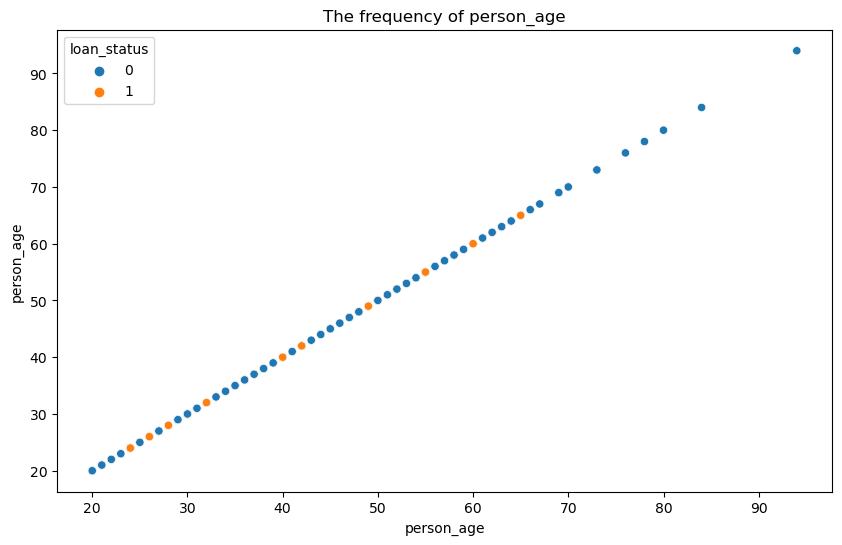

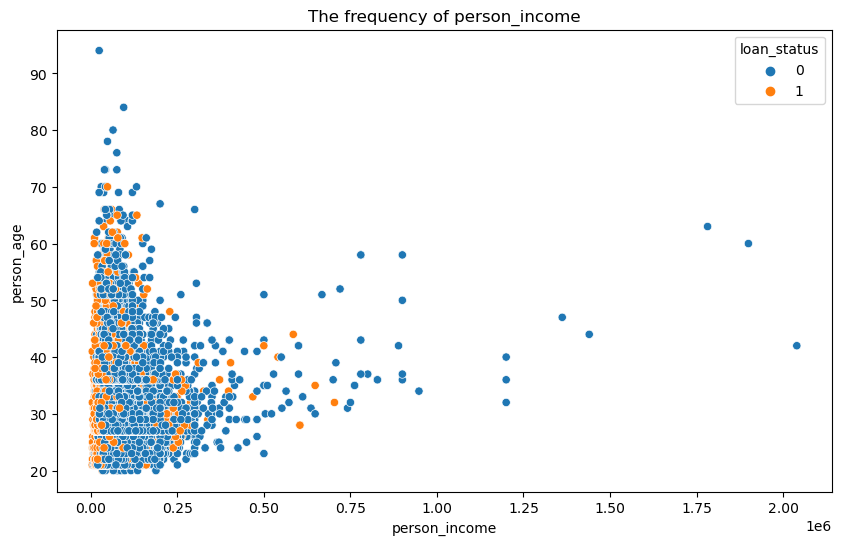

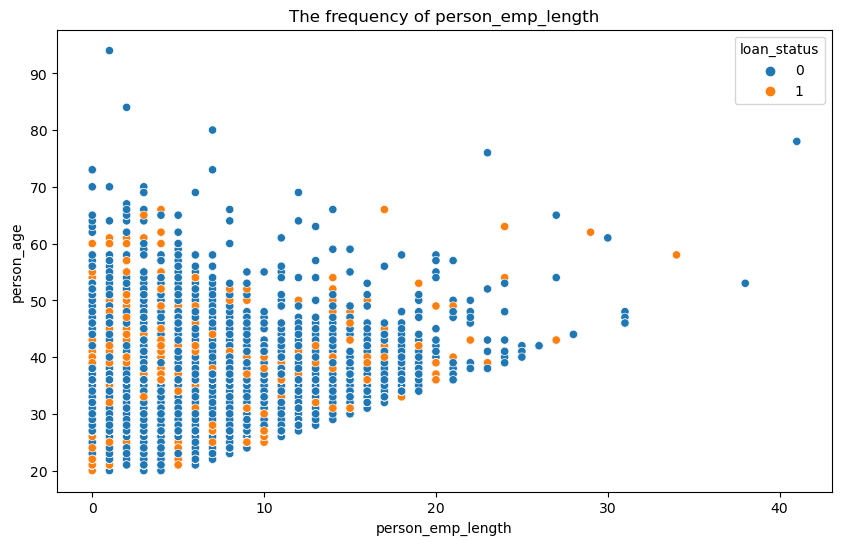

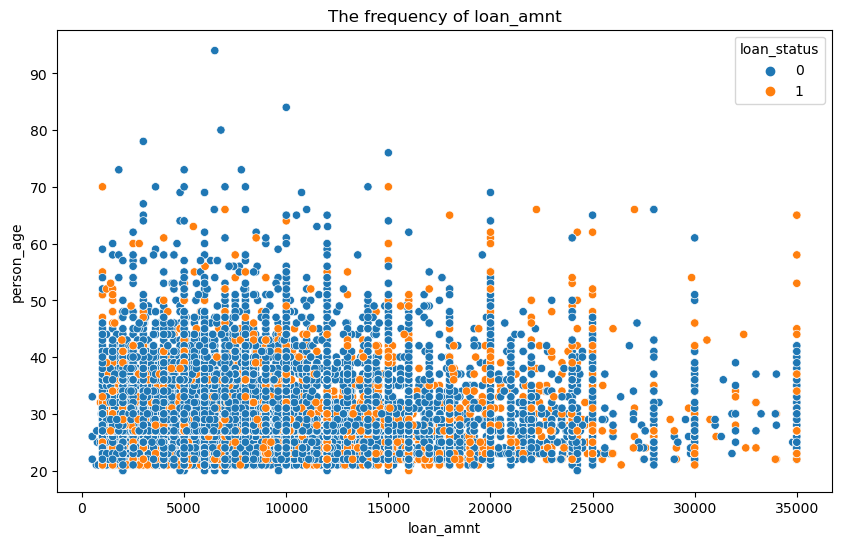

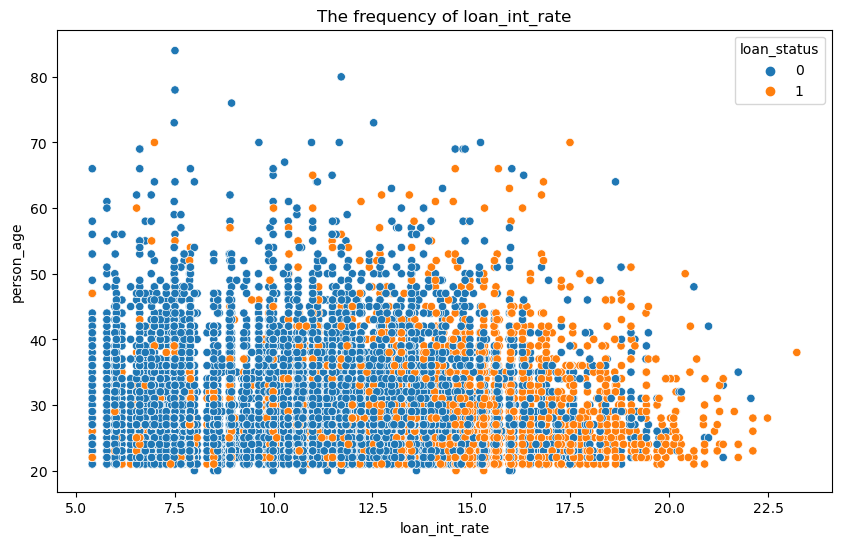

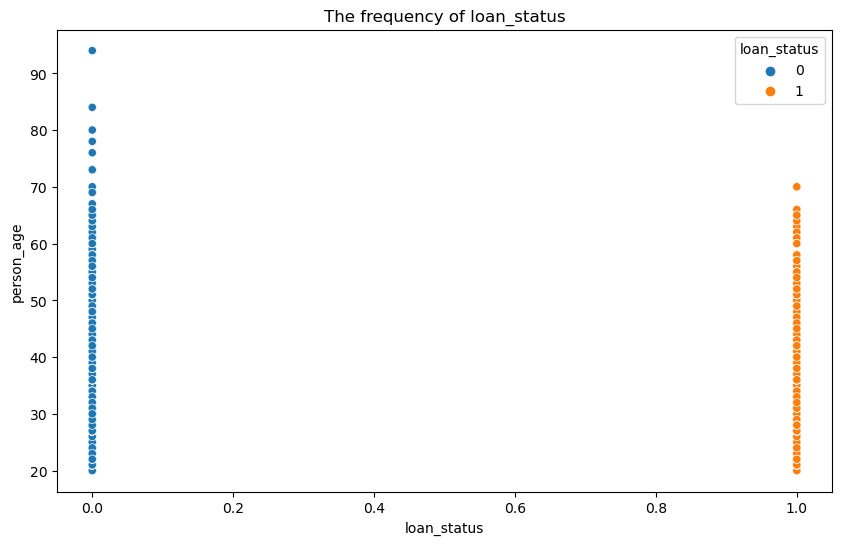

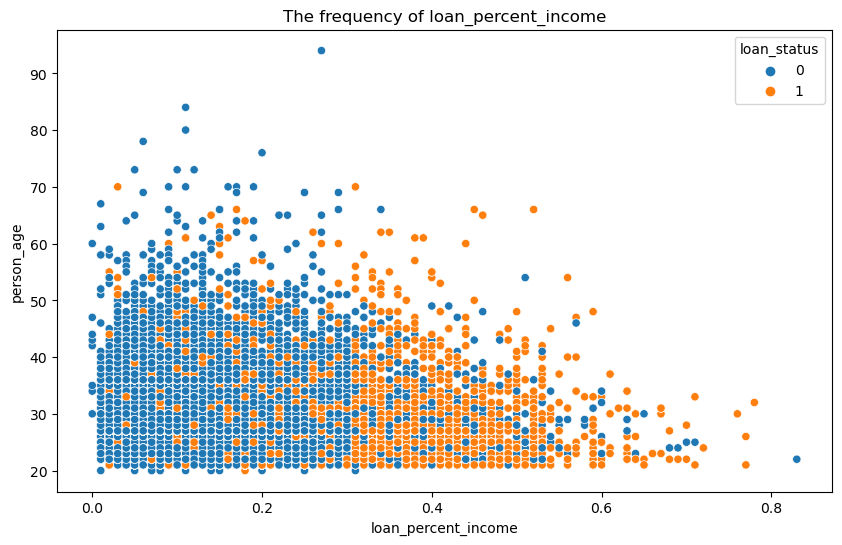

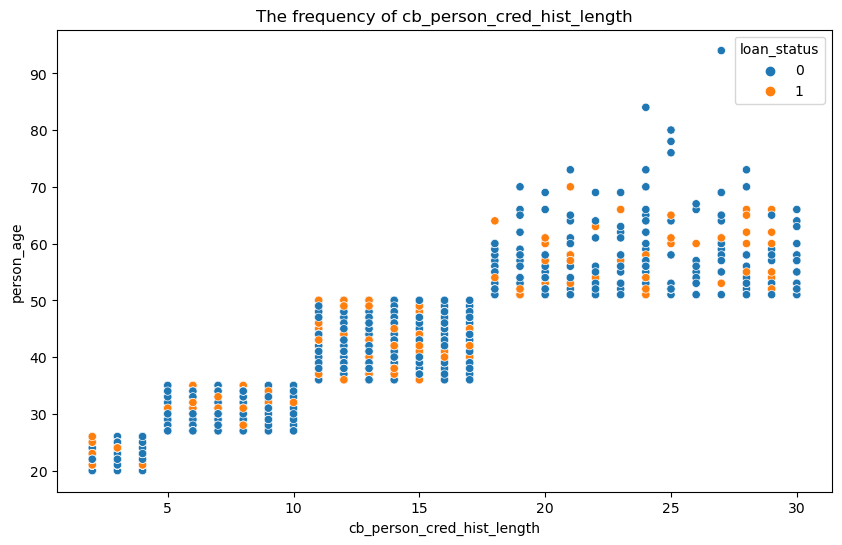

In [66]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "person_age", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

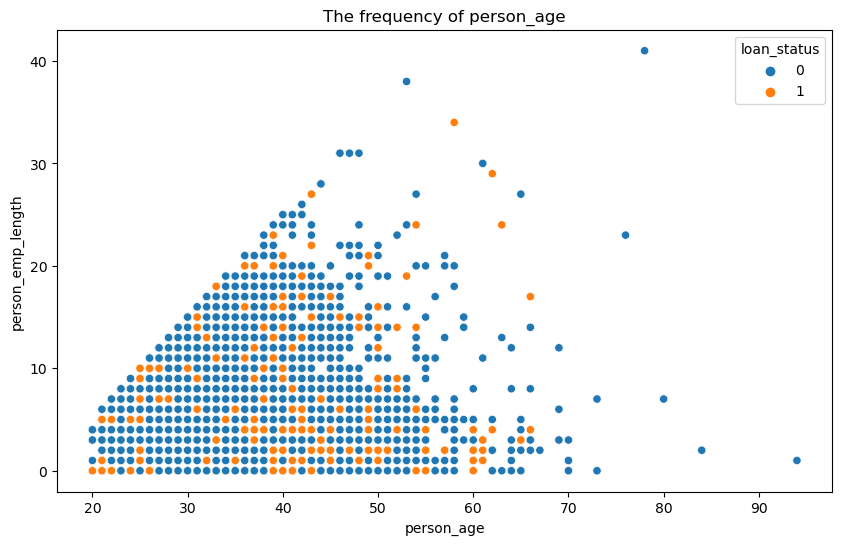

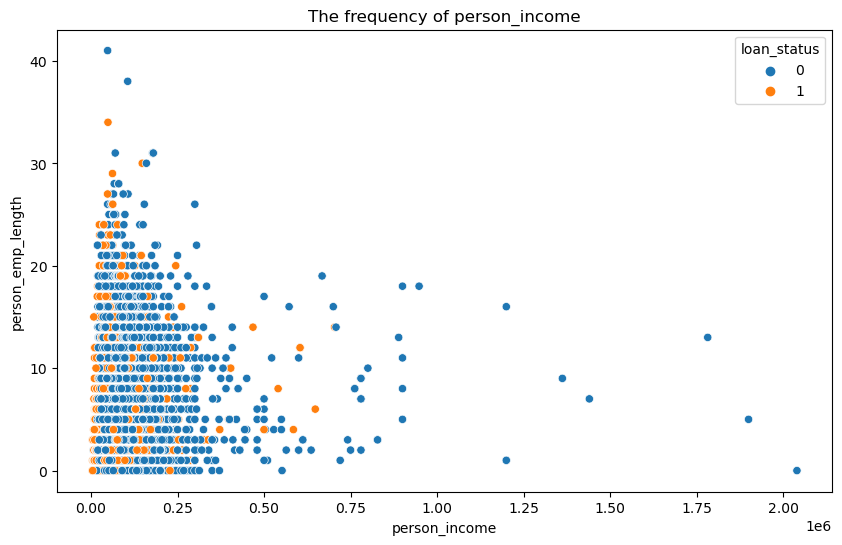

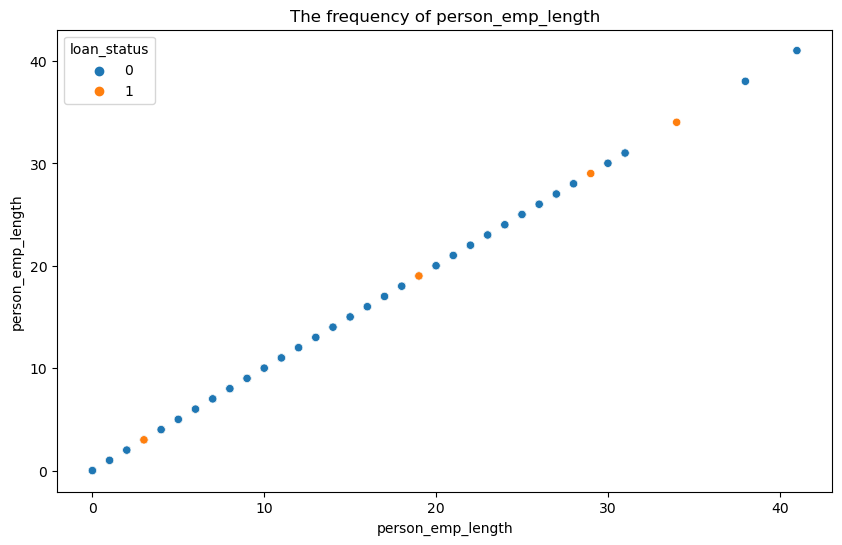

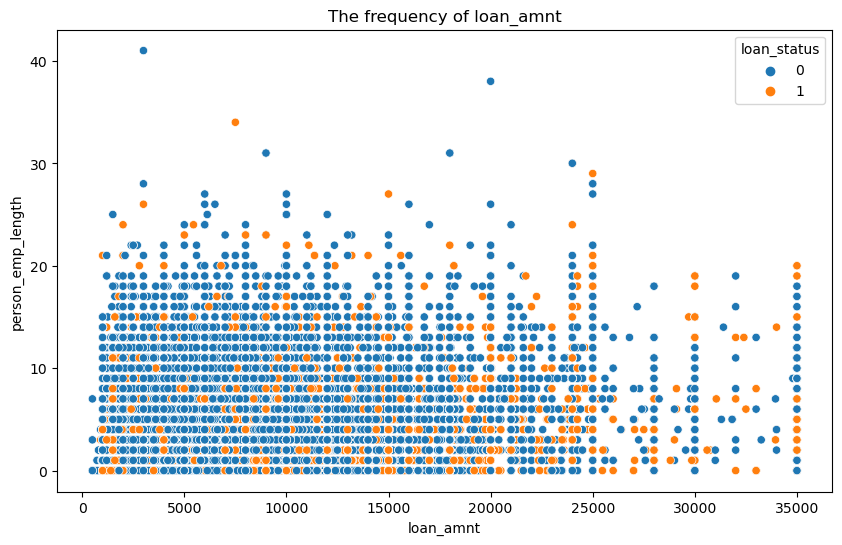

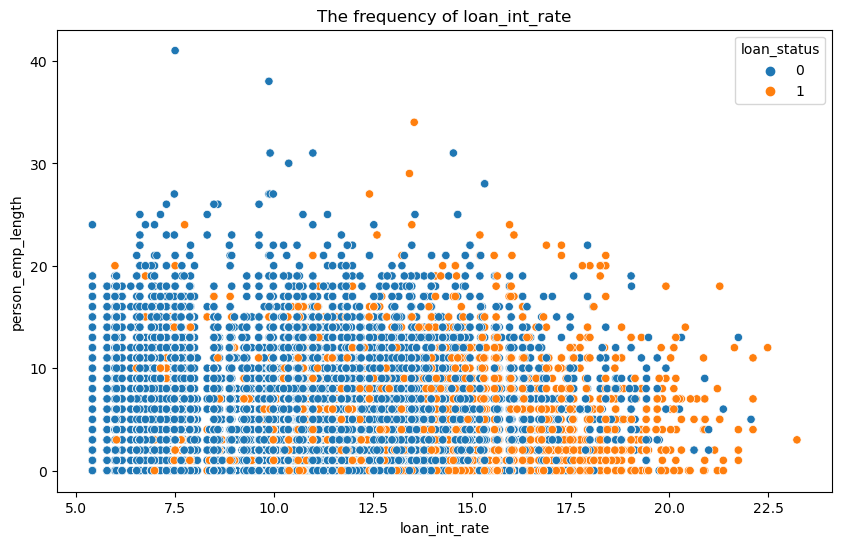

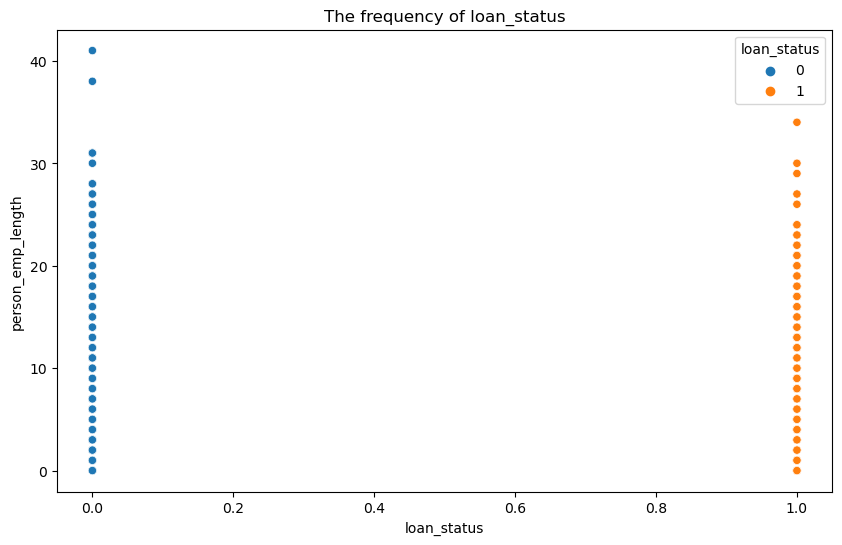

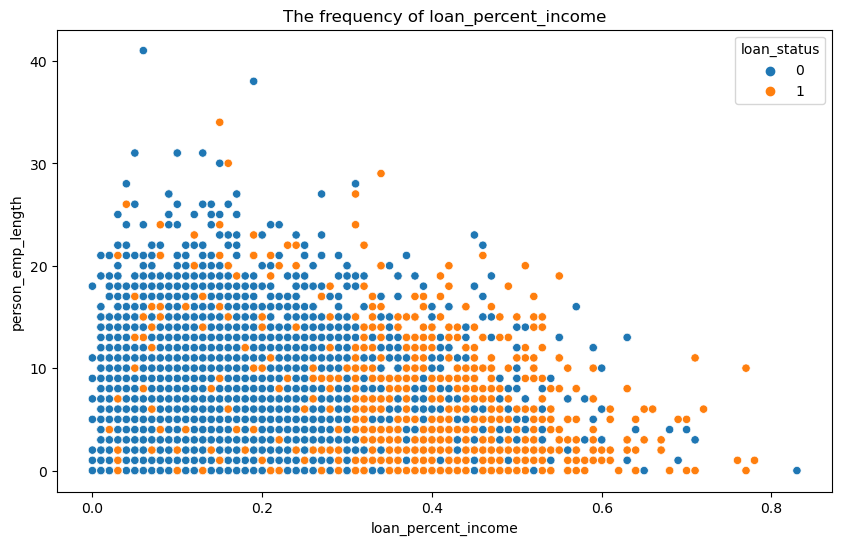

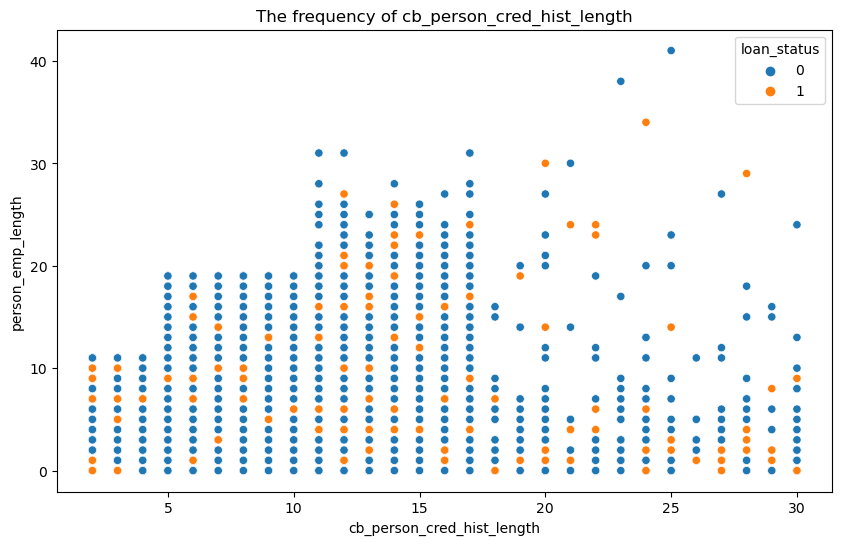

In [67]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "person_emp_length", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

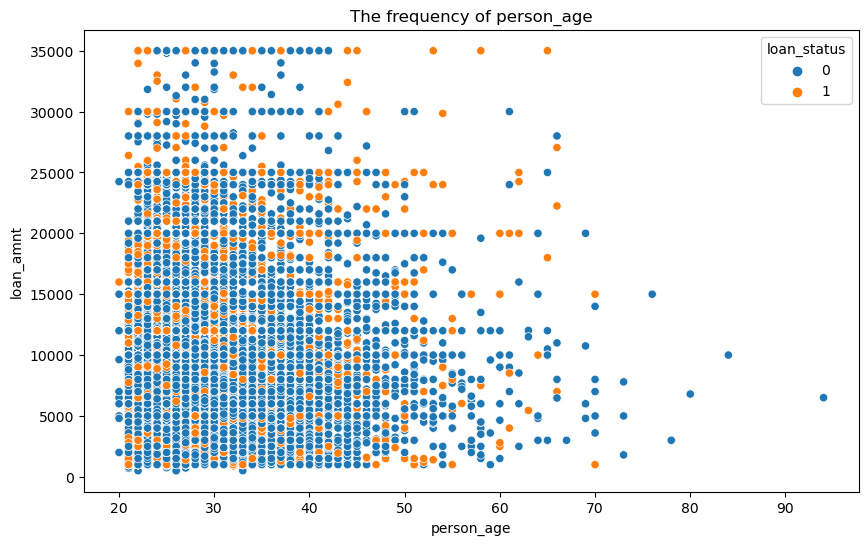

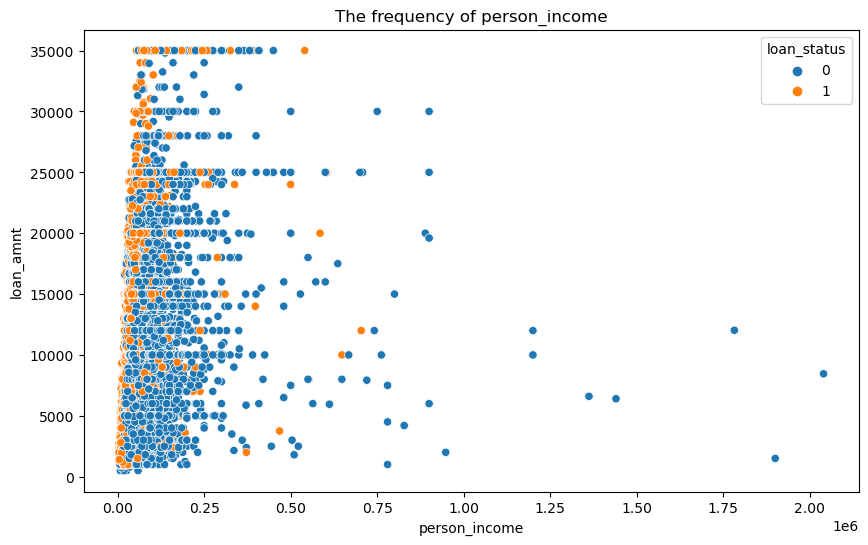

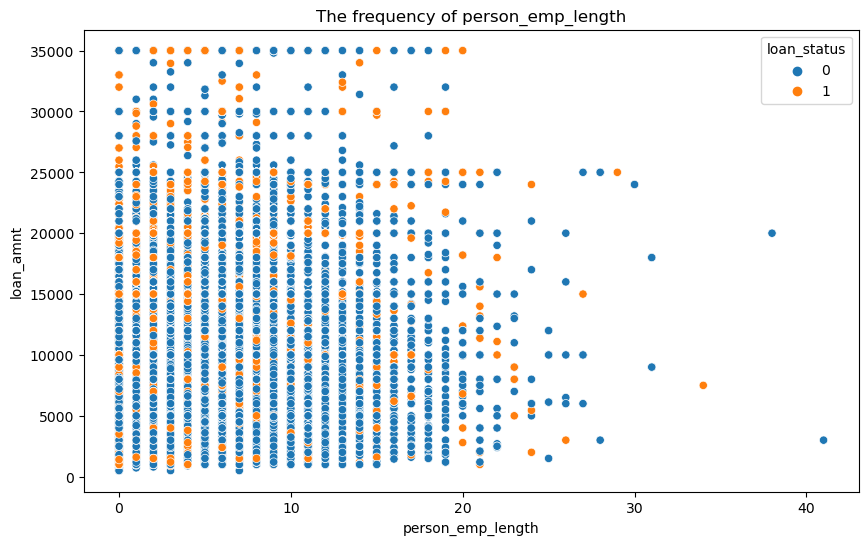

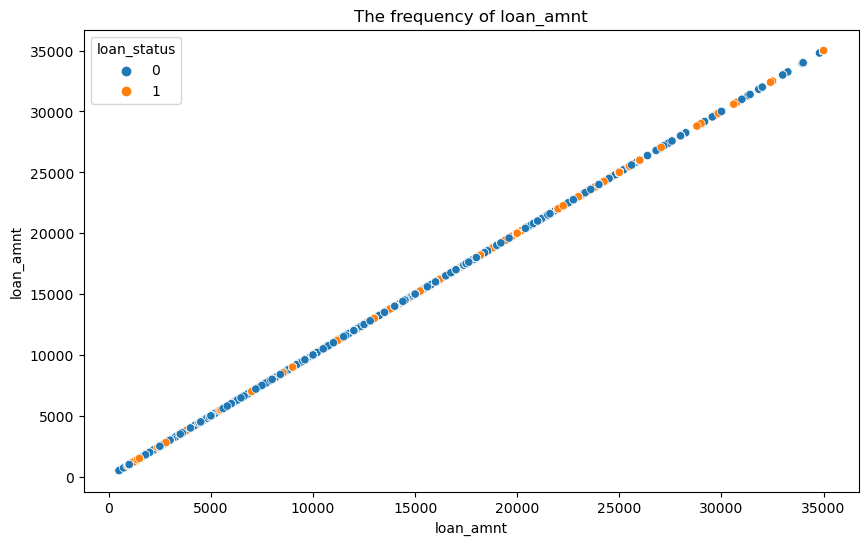

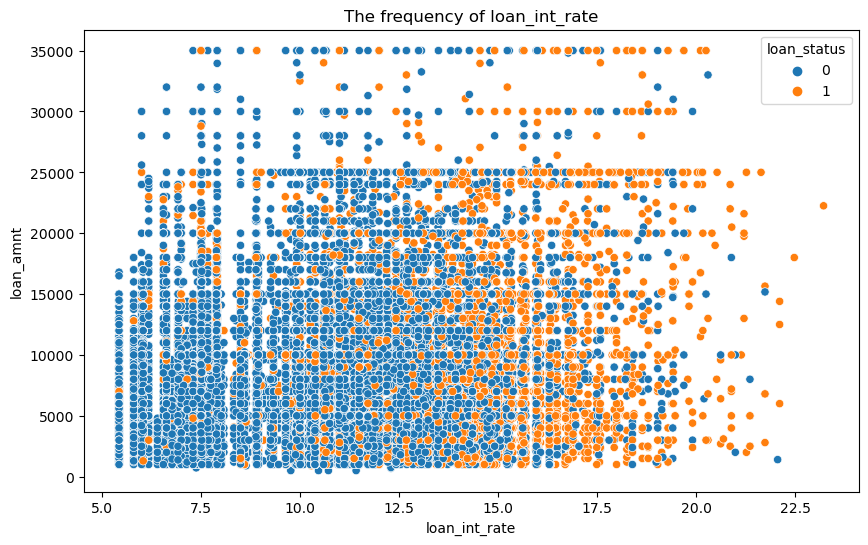

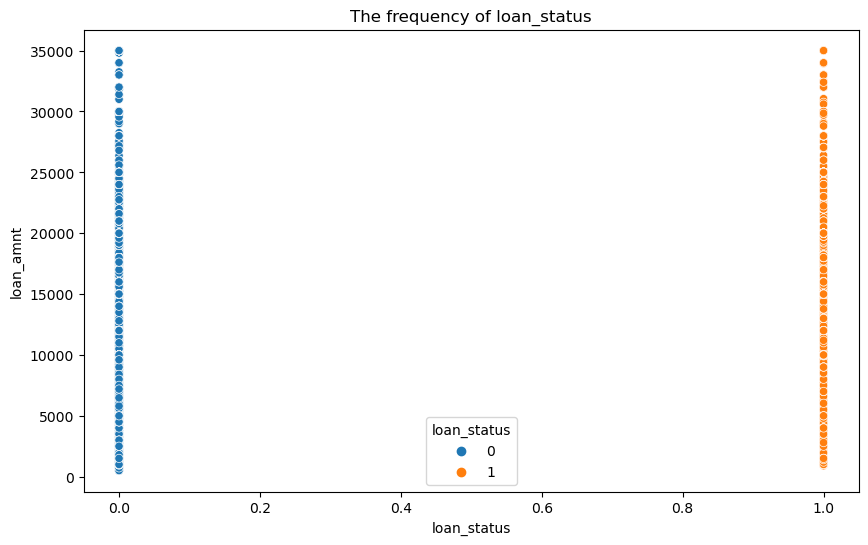

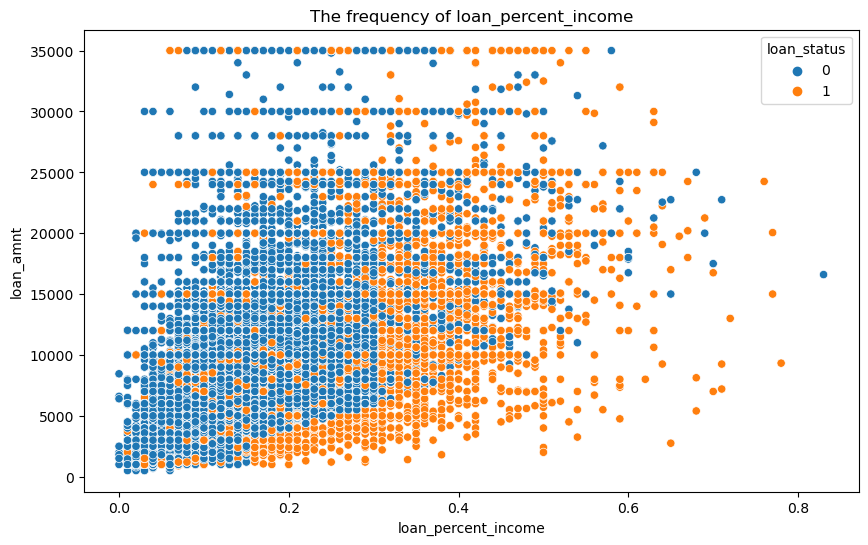

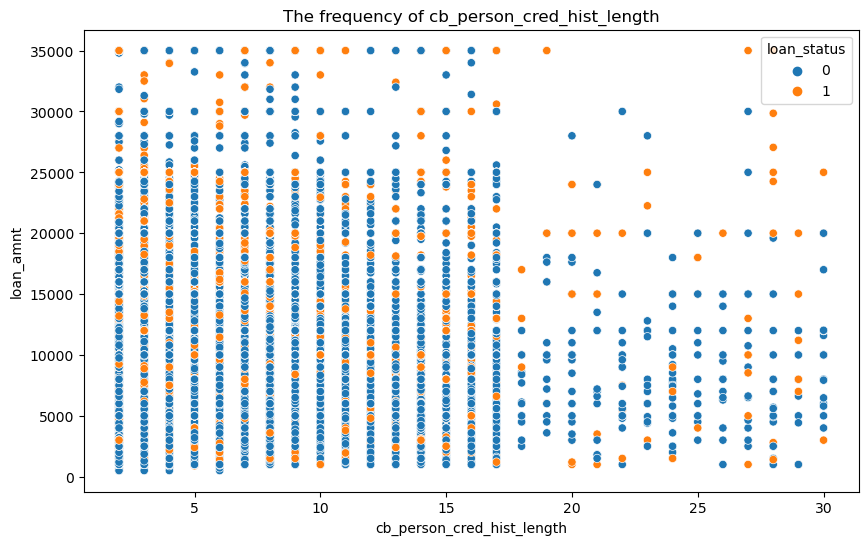

In [68]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "loan_amnt", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

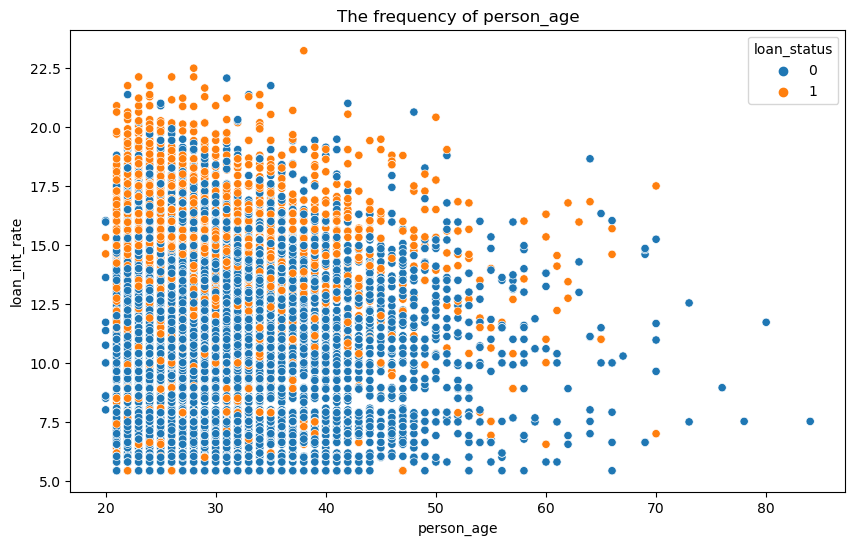

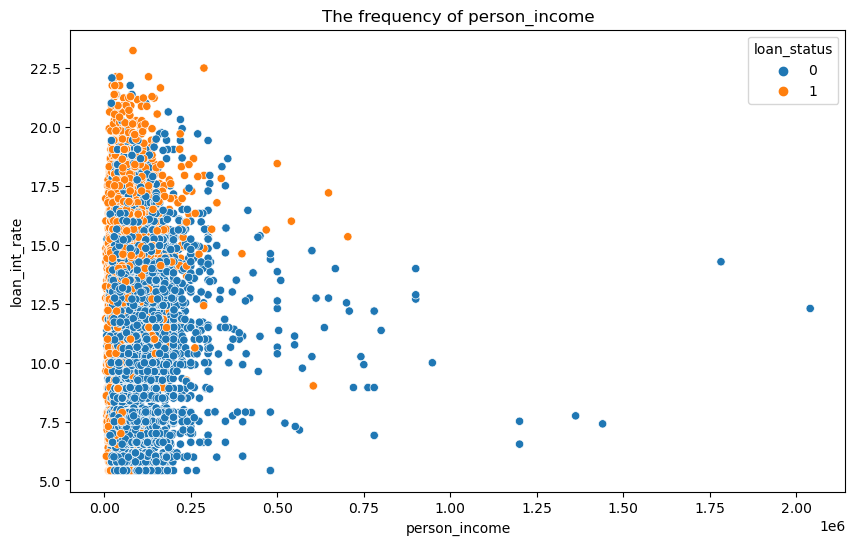

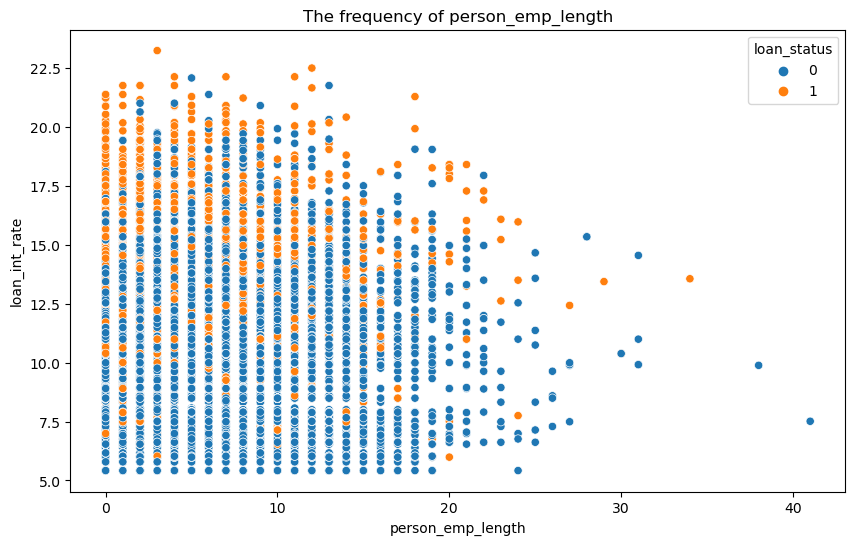

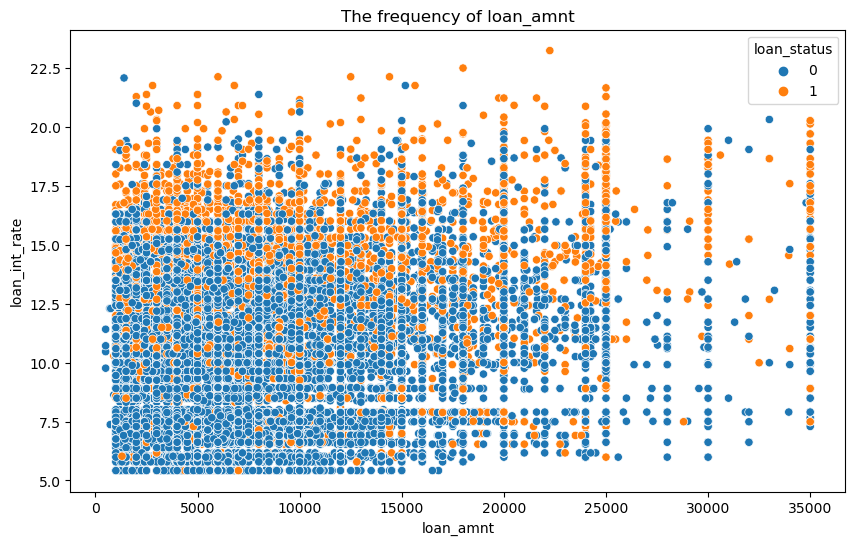

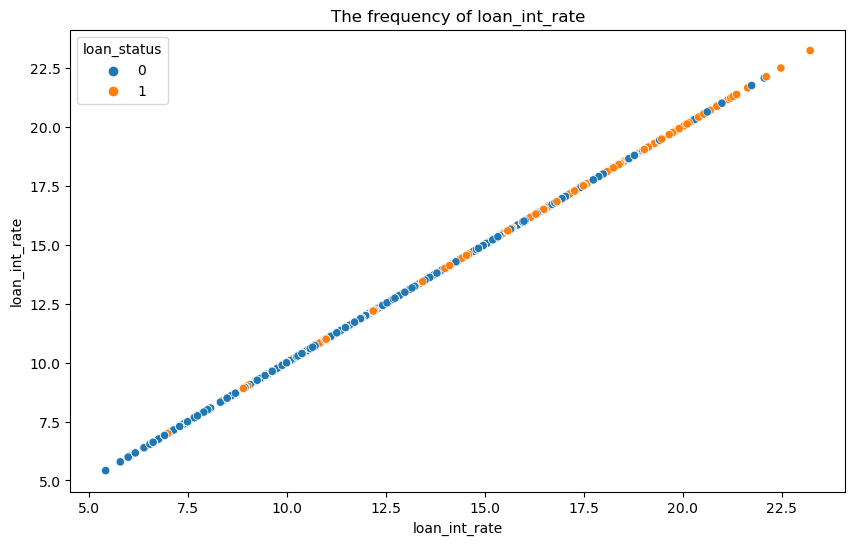

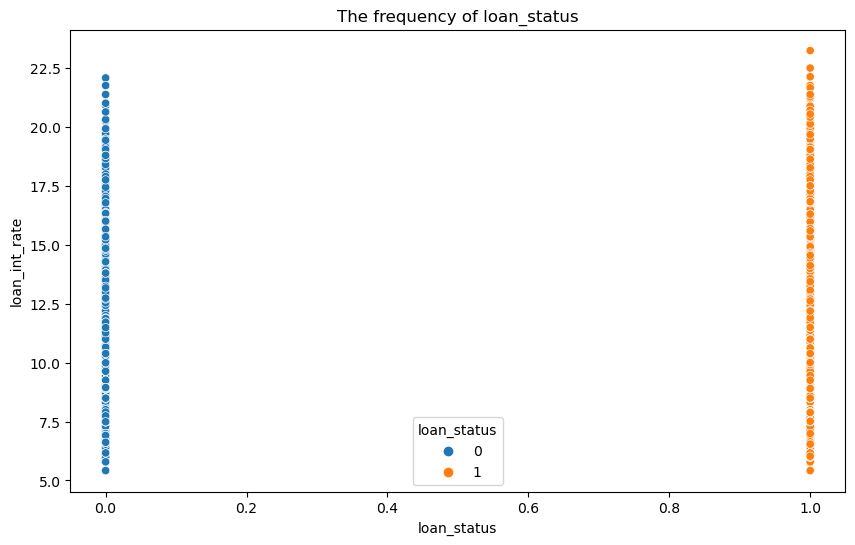

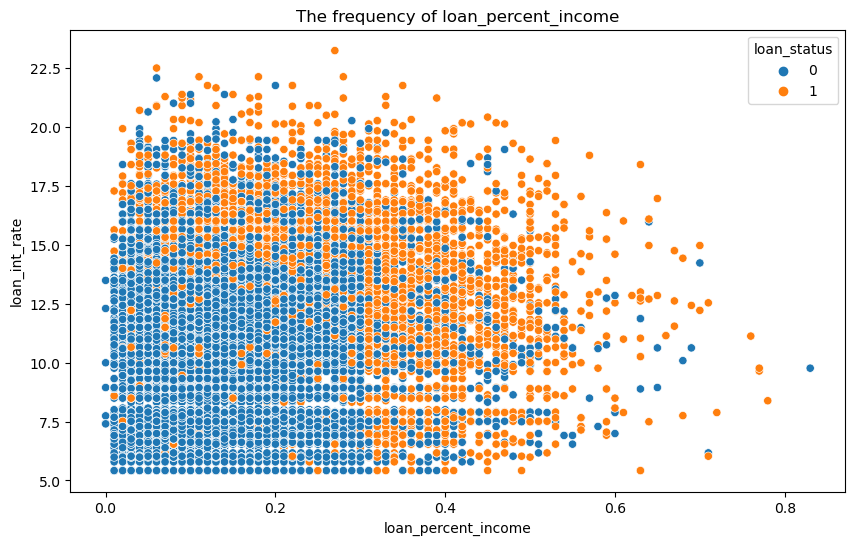

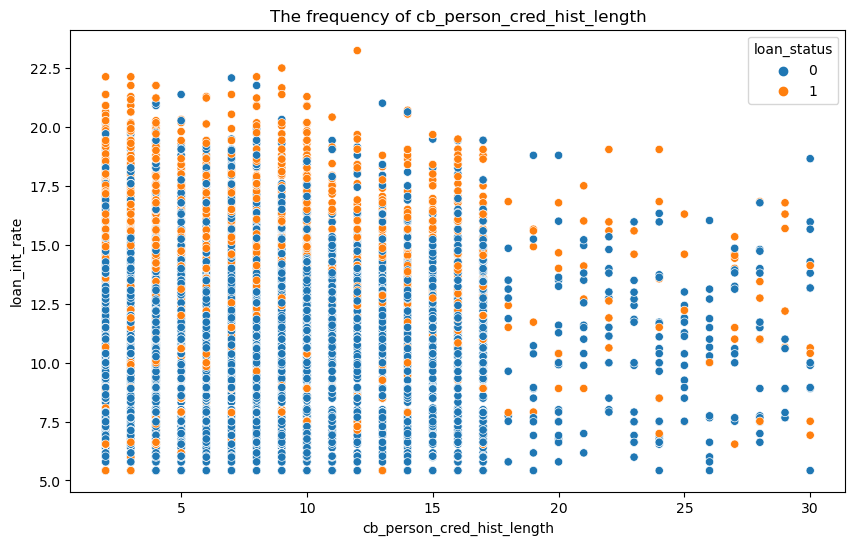

In [69]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "loan_int_rate", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

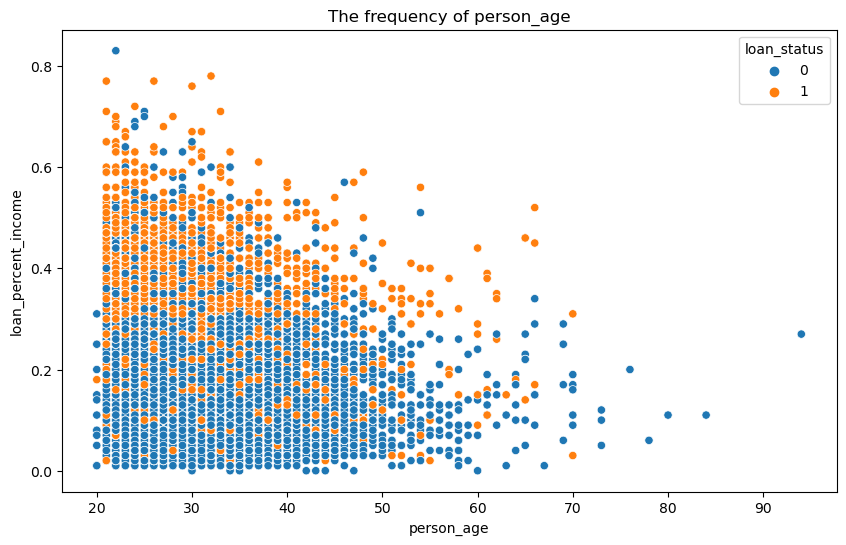

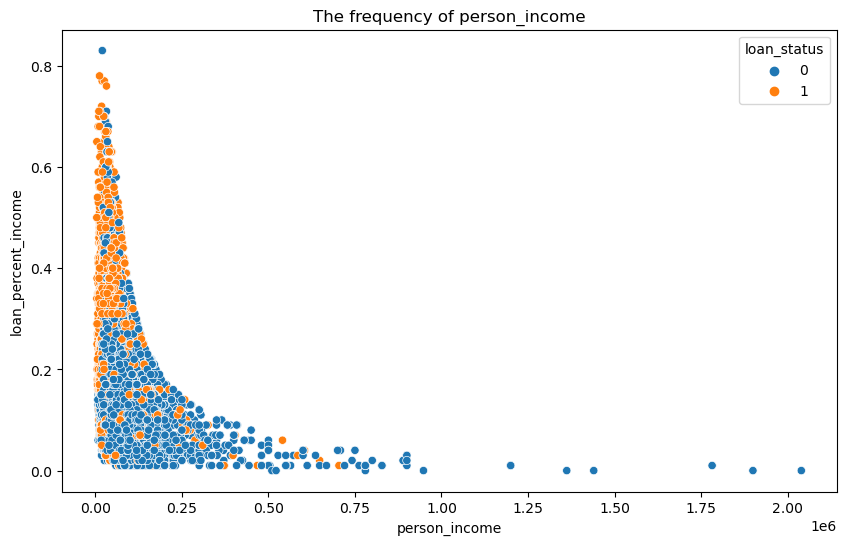

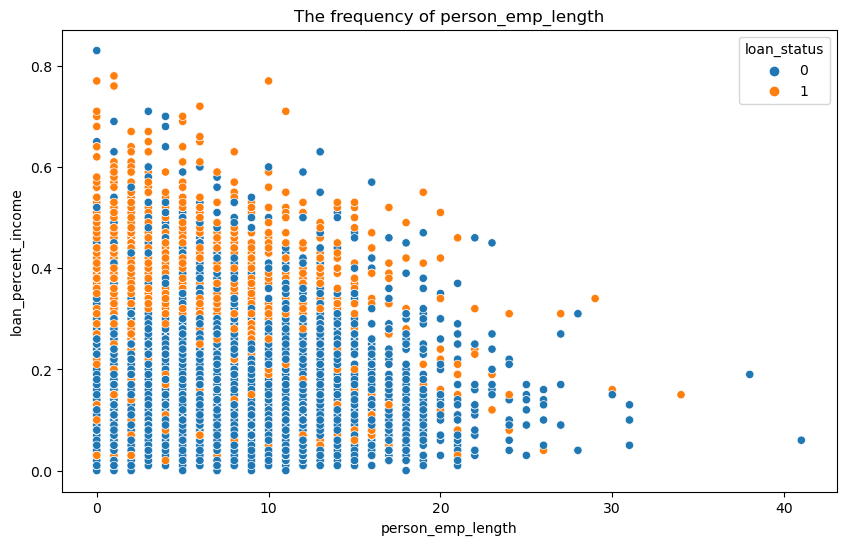

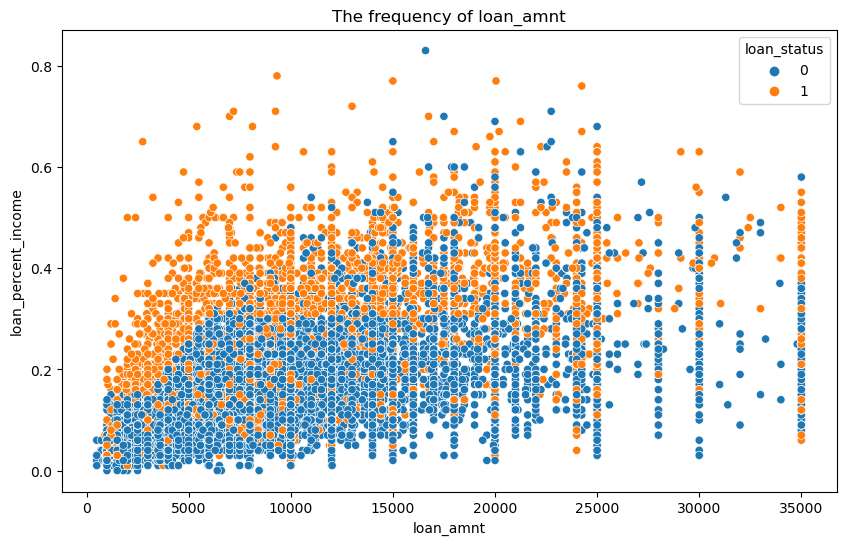

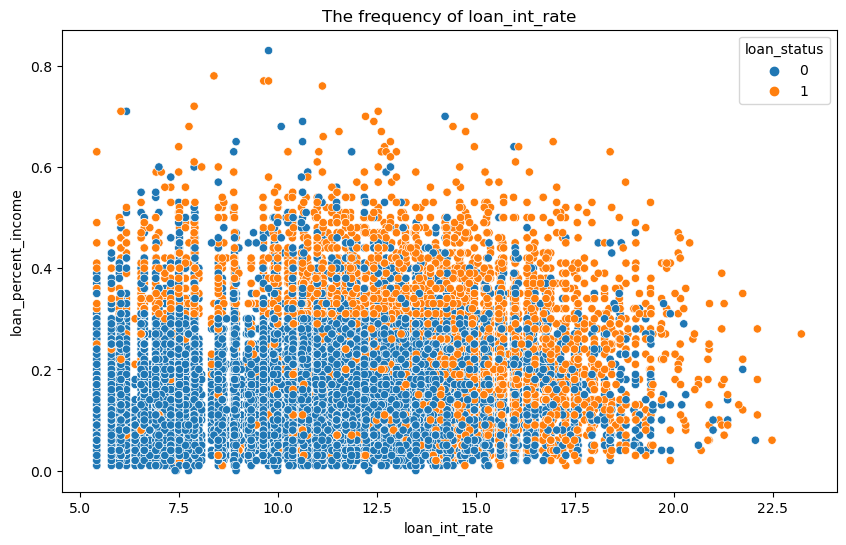

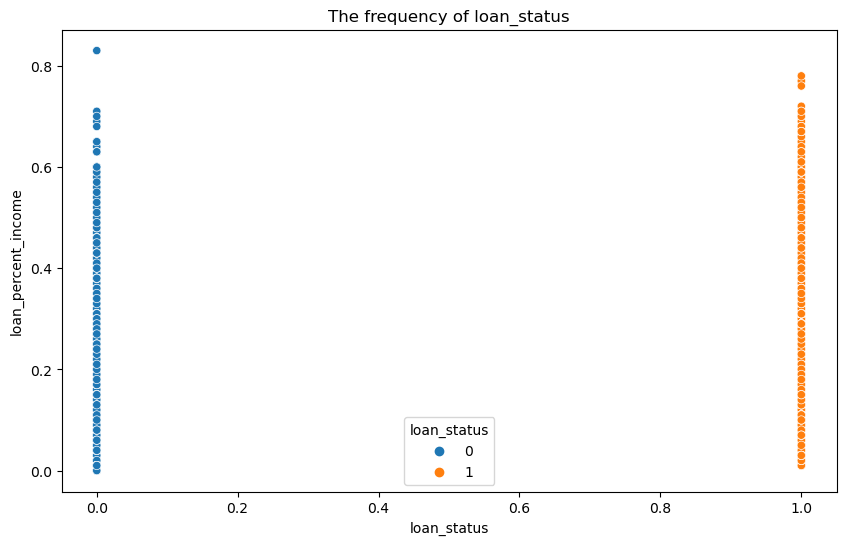

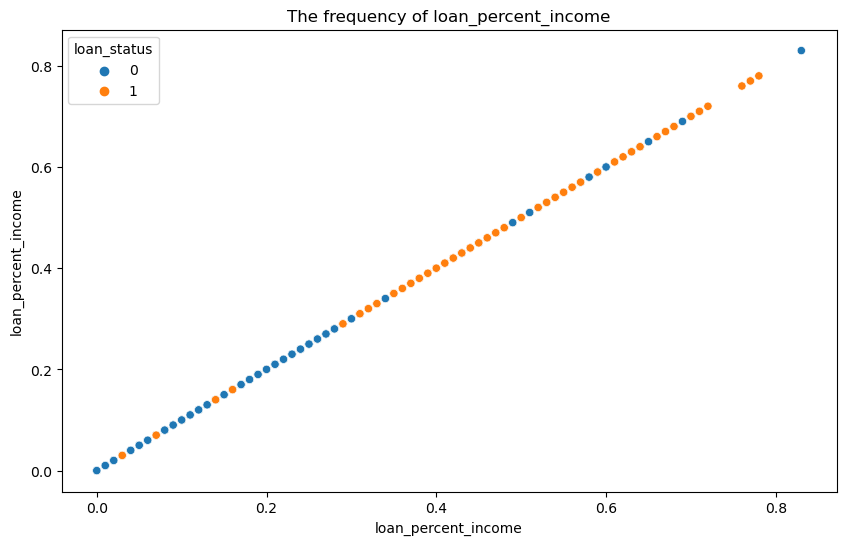

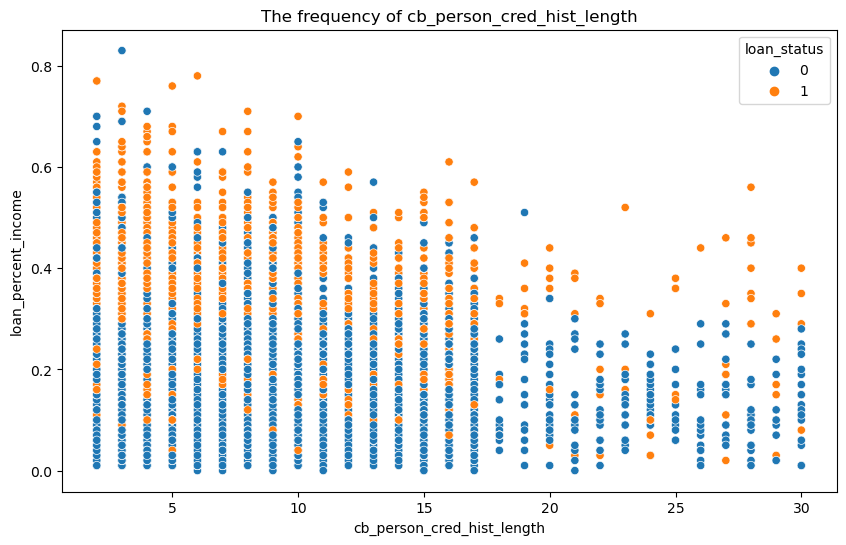

In [70]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "loan_percent_income", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

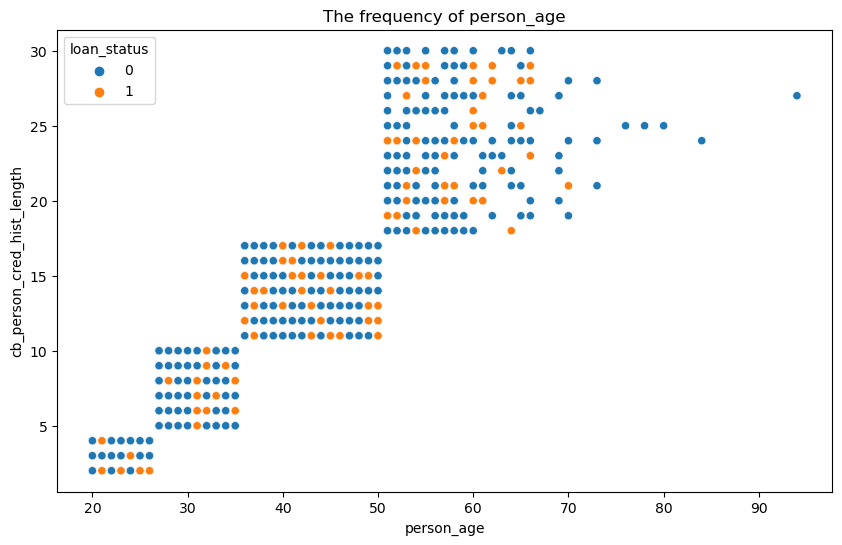

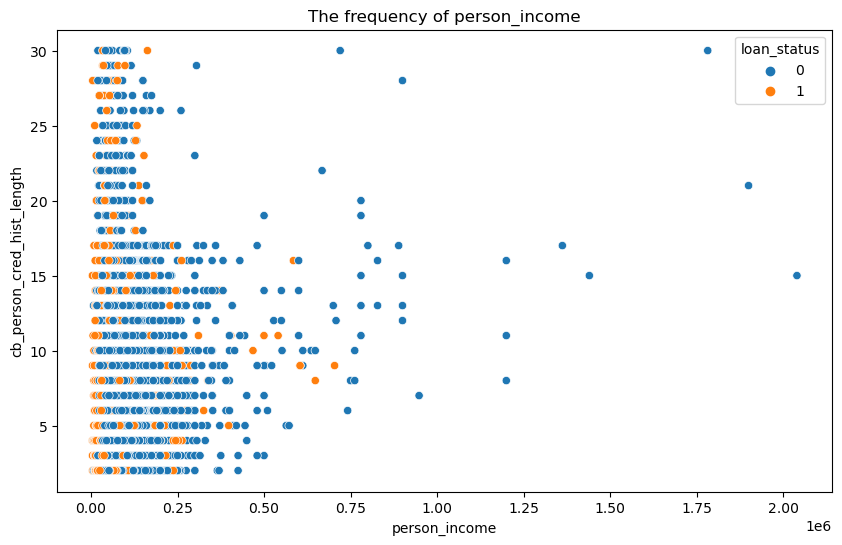

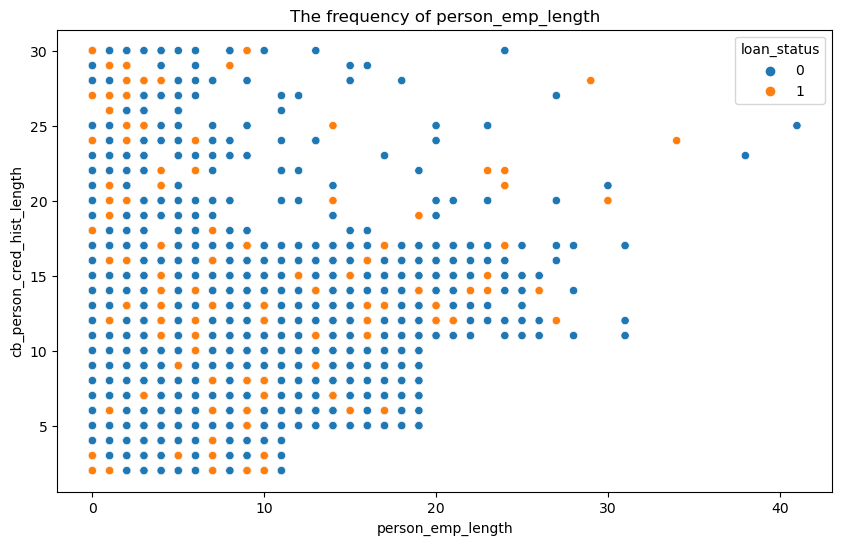

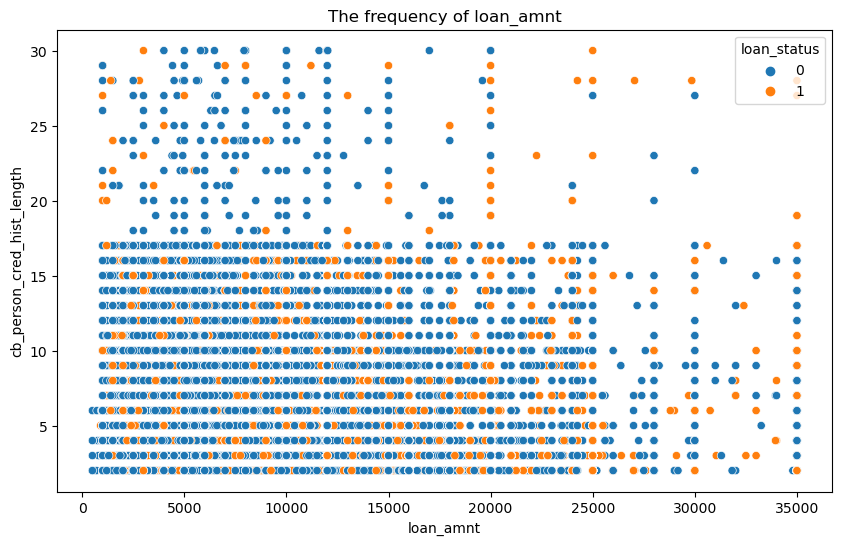

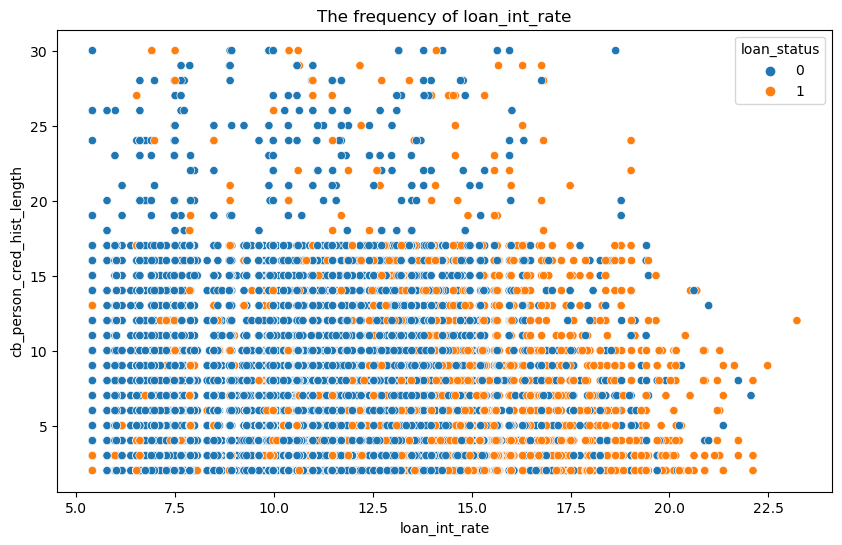

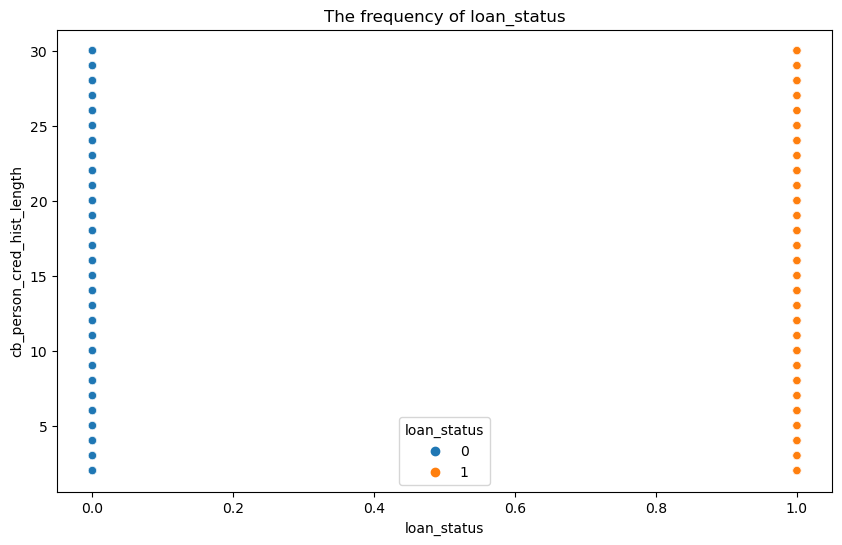

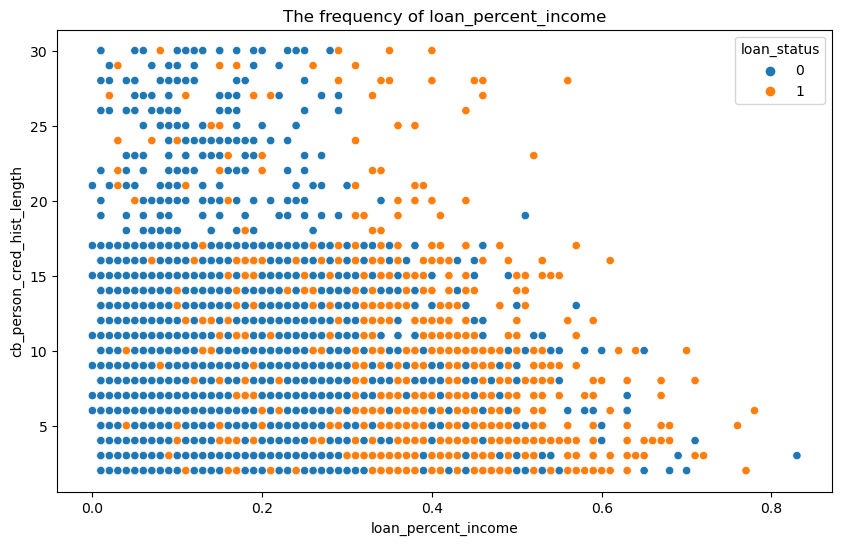

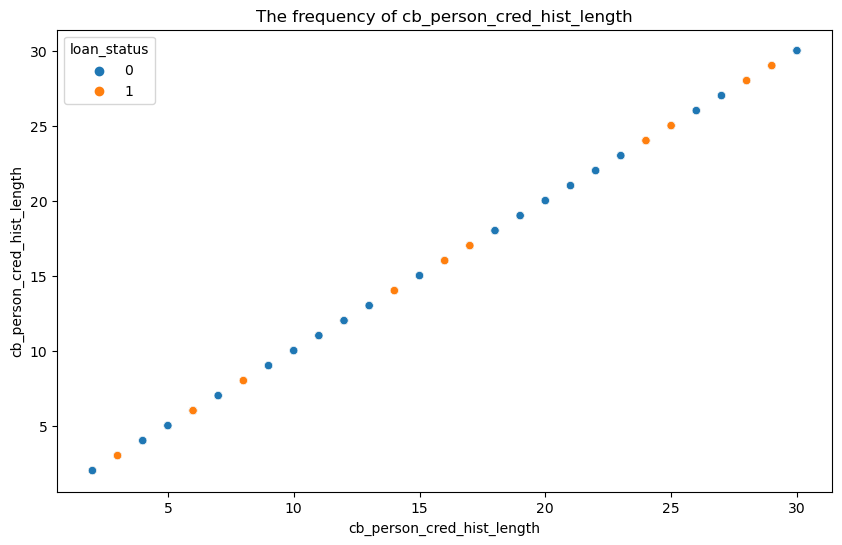

In [71]:
for i in num_col:
    plt.figure(figsize = (10,6))
    sns.scatterplot(data = df, x = i, y = "cb_person_cred_hist_length", hue = "loan_status")
    plt.title(f"The frequency of {i}")
    plt.show()

In [72]:
df[num_col].corr()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.140497,0.172554,0.051751,0.011966,-0.020687,-0.041587,0.878094
person_income,0.140497,1.000000,0.154746,0.317497,-0.001121,-0.168485,-0.294558,0.123049
person_emp_length,0.172554,0.154746,1.000000,0.110993,-0.058263,-0.085966,-0.058559,0.149404
loan_amnt,0.051751,0.317497,0.110993,1.000000,0.146803,0.105240,0.572420,0.042240
loan_int_rate,0.011966,-0.001121,-0.058263,0.146803,1.000000,0.335092,0.120218,0.016656
loan_status,-0.020687,-0.168485,-0.085966,0.105240,0.335092,1.000000,0.379250,-0.015472
loan_percent_income,-0.041587,-0.294558,-0.058559,0.572420,0.120218,0.379250,1.000000,-0.031447
cb_person_cred_hist_length,0.878094,0.123049,0.149404,0.042240,0.016656,-0.015472,-0.031447,1.000000


#### Conclusion :

##### The person income and loan intrest rate are key factors for a person to whether he/she can default the loan or not

## Sprint - 2

## Model implementation

In [76]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [77]:
#dropping null values from dataframe
df = df.dropna()

In [78]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [79]:
#dropping loan_status as it is a target variable
X = df.drop("loan_status",axis = 1)

In [80]:
X

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,0.25,N,2
...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0.10,N,26


In [81]:
y = df["loan_status"]

In [82]:
y

1        0
2        1
3        1
4        1
5        1
        ..
32576    0
32577    0
32578    1
32579    0
32580    0
Name: loan_status, Length: 28632, dtype: int64

In [83]:
#Application of train_test_split

In [84]:
from sklearn.model_selection import train_test_split

In [85]:
df["loan_status"].value_counts()

loan_status
0    22430
1     6202
Name: count, dtype: int64

In [86]:
df["loan_status"].value_counts(normalize = True)*100

loan_status
0    78.338921
1    21.661079
Name: proportion, dtype: float64

In [87]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3,random_state=12,stratify = y)

In [88]:
X_train.shape

(20042, 11)

In [89]:
X_test.shape

(8590, 11)

In [90]:
y_train.shape

(20042,)

In [91]:
y_test.shape

(8590,)

In [92]:
X_train

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
20893,27,44000,MORTGAGE,3.0,EDUCATION,C,5700,13.23,0.13,Y,9
14523,24,109000,MORTGAGE,8.0,EDUCATION,B,6000,11.99,0.06,N,4
12361,21,39900,RENT,0.0,VENTURE,A,12000,7.90,0.30,N,3
1578,23,33996,RENT,1.0,EDUCATION,A,1500,6.99,0.04,N,4
7559,26,54000,MORTGAGE,4.0,PERSONAL,A,9600,6.62,0.18,N,3
...,...,...,...,...,...,...,...,...,...,...,...
15734,26,148000,MORTGAGE,3.0,DEBTCONSOLIDATION,E,7500,18.39,0.05,Y,3
8647,26,30000,RENT,0.0,EDUCATION,B,8000,9.91,0.27,N,2
21903,32,50004,MORTGAGE,2.0,EDUCATION,C,6250,12.87,0.12,Y,6
24764,33,75000,OWN,17.0,PERSONAL,A,6000,7.68,0.08,N,7


In [93]:
num_col

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

In [94]:
cat_col

Index(['person_home_ownership', 'loan_intent', 'loan_grade',
       'cb_person_default_on_file'],
      dtype='object')

In [95]:
numerical_features = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income',
       'cb_person_cred_hist_length']

Categorical_features = ['person_home_ownership', 'loan_intent','cb_person_default_on_file']

oridinal_feature = ["loan_grade"]

In [96]:
X_train[numerical_features]

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
20893,27,44000,3.0,5700,13.23,0.13,9
14523,24,109000,8.0,6000,11.99,0.06,4
12361,21,39900,0.0,12000,7.90,0.30,3
1578,23,33996,1.0,1500,6.99,0.04,4
7559,26,54000,4.0,9600,6.62,0.18,3
...,...,...,...,...,...,...,...
15734,26,148000,3.0,7500,18.39,0.05,3
8647,26,30000,0.0,8000,9.91,0.27,2
21903,32,50004,2.0,6250,12.87,0.12,6
24764,33,75000,17.0,6000,7.68,0.08,7


In [97]:
from sklearn.preprocessing import StandardScaler,OneHotEncoder

In [98]:
scaler = StandardScaler()
X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])

In [99]:
X_train[numerical_features]

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
20893,-0.117541,-0.427837,-0.443903,-0.624680,0.680459,-0.368984,0.794804
14523,-0.602098,0.792981,0.784957,-0.577146,0.295687,-1.027328,-0.442340
12361,-1.086654,-0.504843,-1.181219,0.373532,-0.973440,1.229851,-0.689769
1578,-0.763617,-0.615731,-0.935447,-1.290154,-1.255813,-1.215426,-0.442340
7559,-0.279060,-0.240019,-0.198131,-0.006739,-1.370624,0.101262,-0.689769
...,...,...,...,...,...,...,...
15734,-0.279060,1.525472,-0.443903,-0.339476,2.281608,-1.121377,-0.689769
8647,-0.279060,-0.690783,-1.181219,-0.260253,-0.349737,0.947704,-0.937198
21903,0.690054,-0.315071,-0.689675,-0.537534,0.568751,-0.463033,0.052518
24764,0.851573,0.154399,2.996905,-0.577146,-1.041706,-0.839230,0.299947


In [100]:
X_train[['person_home_ownership', 'loan_intent',
       'cb_person_default_on_file']]

,person_home_ownership,loan_intent,cb_person_default_on_file
20893,MORTGAGE,EDUCATION,Y
14523,MORTGAGE,EDUCATION,N
12361,RENT,VENTURE,N
1578,RENT,EDUCATION,N
7559,MORTGAGE,PERSONAL,N
...,...,...,...
15734,MORTGAGE,DEBTCONSOLIDATION,Y
8647,RENT,EDUCATION,N
21903,MORTGAGE,EDUCATION,Y
24764,OWN,PERSONAL,N


In [101]:
ohe = OneHotEncoder(sparse_output=False,drop = "first")
ohe_encoded = ohe.fit_transform(X_train[Categorical_features])

In [102]:
X_train

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
20893,-0.117541,-0.427837,MORTGAGE,-0.443903,EDUCATION,C,-0.624680,0.680459,-0.368984,Y,0.794804
14523,-0.602098,0.792981,MORTGAGE,0.784957,EDUCATION,B,-0.577146,0.295687,-1.027328,N,-0.442340
12361,-1.086654,-0.504843,RENT,-1.181219,VENTURE,A,0.373532,-0.973440,1.229851,N,-0.689769
1578,-0.763617,-0.615731,RENT,-0.935447,EDUCATION,A,-1.290154,-1.255813,-1.215426,N,-0.442340
7559,-0.279060,-0.240019,MORTGAGE,-0.198131,PERSONAL,A,-0.006739,-1.370624,0.101262,N,-0.689769
...,...,...,...,...,...,...,...,...,...,...,...
15734,-0.279060,1.525472,MORTGAGE,-0.443903,DEBTCONSOLIDATION,E,-0.339476,2.281608,-1.121377,Y,-0.689769
8647,-0.279060,-0.690783,RENT,-1.181219,EDUCATION,B,-0.260253,-0.349737,0.947704,N,-0.937198
21903,0.690054,-0.315071,MORTGAGE,-0.689675,EDUCATION,C,-0.537534,0.568751,-0.463033,Y,0.052518
24764,0.851573,0.154399,OWN,2.996905,PERSONAL,A,-0.577146,-1.041706,-0.839230,N,0.299947


In [103]:
ohe_encoded = pd.DataFrame(ohe_encoded,columns = ohe.get_feature_names_out(),index = X_train.index)

In [104]:
X_train = X_train.drop(columns  =Categorical_features).join(ohe_encoded)

In [105]:
ohe.get_feature_names_out()

array(['person_home_ownership_OTHER', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_EDUCATION',
       'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL',
       'loan_intent_PERSONAL', 'loan_intent_VENTURE',
       'cb_person_default_on_file_Y'], dtype=object)

In [106]:
X_train

,person_age,person_income,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,cb_person_default_on_file_Y
20893,-0.117541,-0.427837,-0.443903,C,-0.624680,0.680459,-0.368984,0.794804,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
14523,-0.602098,0.792981,0.784957,B,-0.577146,0.295687,-1.027328,-0.442340,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
12361,-1.086654,-0.504843,-1.181219,A,0.373532,-0.973440,1.229851,-0.689769,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1578,-0.763617,-0.615731,-0.935447,A,-1.290154,-1.255813,-1.215426,-0.442340,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
7559,-0.279060,-0.240019,-0.198131,A,-0.006739,-1.370624,0.101262,-0.689769,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15734,-0.279060,1.525472,-0.443903,E,-0.339476,2.281608,-1.121377,-0.689769,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8647,-0.279060,-0.690783,-1.181219,B,-0.260253,-0.349737,0.947704,-0.937198,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
21903,0.690054,-0.315071,-0.689675,C,-0.537534,0.568751,-0.463033,0.052518,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
24764,0.851573,0.154399,2.996905,A,-0.577146,-1.041706,-0.839230,0.299947,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [107]:
df["loan_grade"]

1        B
2        C
3        C
4        C
5        A
        ..
32576    C
32577    A
32578    B
32579    B
32580    B
Name: loan_grade, Length: 28632, dtype: object

In [108]:
df["loan_grade"].unique()

array(['B', 'C', 'A', 'D', 'E', 'F', 'G'], dtype=object)

In [109]:
ranking_ = {"A":1,"B":2,"C":3,"D":4,"E":5,"F":6,"G":7}
X_train[oridinal_feature] = X_train[oridinal_feature].replace(ranking_)

In [110]:
X_train

,person_age,person_income,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,cb_person_default_on_file_Y
20893,-0.117541,-0.427837,-0.443903,3,-0.624680,0.680459,-0.368984,0.794804,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
14523,-0.602098,0.792981,0.784957,2,-0.577146,0.295687,-1.027328,-0.442340,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
12361,-1.086654,-0.504843,-1.181219,1,0.373532,-0.973440,1.229851,-0.689769,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1578,-0.763617,-0.615731,-0.935447,1,-1.290154,-1.255813,-1.215426,-0.442340,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
7559,-0.279060,-0.240019,-0.198131,1,-0.006739,-1.370624,0.101262,-0.689769,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15734,-0.279060,1.525472,-0.443903,5,-0.339476,2.281608,-1.121377,-0.689769,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8647,-0.279060,-0.690783,-1.181219,2,-0.260253,-0.349737,0.947704,-0.937198,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
21903,0.690054,-0.315071,-0.689675,3,-0.537534,0.568751,-0.463033,0.052518,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
24764,0.851573,0.154399,2.996905,1,-0.577146,-1.041706,-0.839230,0.299947,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [111]:
X_test[numerical_features] = scaler.transform(X_test[numerical_features])
ohe_encoded = ohe.transform(X_test[Categorical_features])
ohe_encoded = pd.DataFrame(ohe_encoded,columns = ohe.get_feature_names_out(),index = X_test.index)
X_test = X_test.drop(columns  =Categorical_features).join(ohe_encoded)
X_test[oridinal_feature] = X_test[oridinal_feature].replace(ranking_)

In [112]:
X_test

,person_age,person_income,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,cb_person_default_on_file_Y
22544,-0.117541,-0.210043,0.047641,1,-1.210931,-1.094457,-1.215426,0.794804,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
27208,0.851573,1.112272,2.996905,1,-0.022584,-1.742984,-0.839230,0.299947,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
25665,-0.117541,0.417345,1.522273,4,-1.084174,1.217278,-1.309475,1.042233,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4731,-0.279060,-0.690783,-0.689675,2,-0.735592,0.429116,0.007213,-0.937198,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3355,-0.925136,-0.484183,-0.689675,2,0.215086,0.354644,0.947704,-0.442340,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7458,-0.279060,-0.484183,-0.198131,1,-0.458311,-1.566113,-0.086837,-0.689769,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
12715,-0.602098,-0.088825,-0.935447,3,-0.640524,1.121085,-0.839230,-0.442340,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
26959,0.205497,0.999581,0.539185,2,1.641103,0.429116,0.007213,0.052518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26888,1.174611,-0.758397,3.488449,1,-0.482078,-1.566113,0.759606,0.547376,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## Model Building

In [123]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [125]:
models = {"KNN" : KNeighborsClassifier(),
          "RF" : RandomForestClassifier(),
          "LR" : LogisticRegression(),
          "SVC" :SVC()
         }

In [131]:
import numpy as np
from sklearn.metrics import accuracy_score

X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

accuracy_model = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)  # Train the model
    y_pred = model.predict(X_test)  # Predict on the test set
    accuracy = accuracy_score(y_test, y_pred)  # Calculate accuracy
    accuracy_model[model_name] = accuracy  # Store results


In [132]:
print(f"X_train type: {type(X_train)}, shape: {X_train.shape}")
print(f"X_test type: {type(X_test)}, shape: {X_test.shape}")
print(f"y_train type: {type(y_train)}, shape: {y_train.shape}")
print(f"y_test type: {type(y_test)}, shape: {y_test.shape}")


X_train type: <class 'numpy.ndarray'>, shape: (20042, 17)
X_test type: <class 'numpy.ndarray'>, shape: (8590, 17)
y_train type: <class 'numpy.ndarray'>, shape: (20042,)
y_test type: <class 'numpy.ndarray'>, shape: (8590,)


In [135]:
from scipy.sparse import csr_matrix
X_train = csr_matrix(X_train)
X_test = csr_matrix(X_test)


In [137]:
accuracy_model = {}
for model_name,model in models.items():
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)
    accuracy_model[model_name] = accuracy
    print(f"{model_name} Accuracy - {accuracy}")

KNN Accuracy - 0.8885913853317812
RF Accuracy - 0.9335273573923166
LR Accuracy - 0.850873108265425
SVC Accuracy - 0.9083818393480791


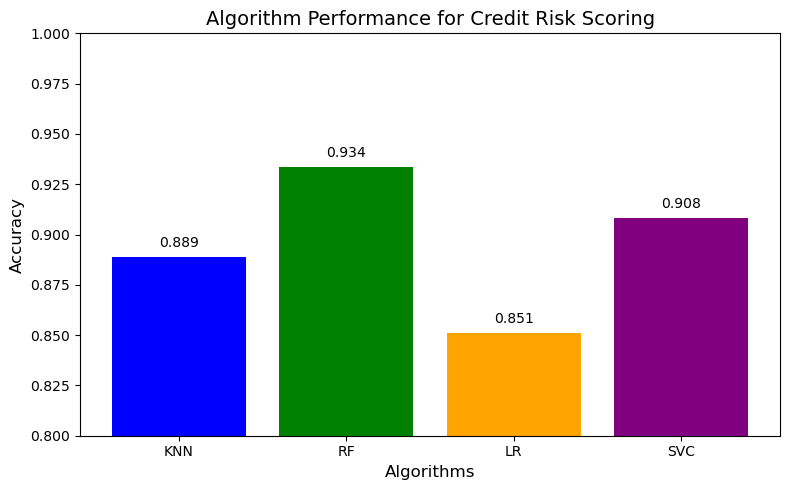

In [139]:
#Using barplot to show the algorithms applied along with the accuracies achieved
import matplotlib.pyplot as plt
algorithms = ['KNN', 'RF', 'LR', 'SVC']
accuracies = [0.8885913853317812, 0.9335273573923166, 0.850873108265425, 0.9083818393480791]
plt.figure(figsize=(8, 5))
plt.bar(algorithms, accuracies, color=['blue', 'green', 'orange', 'purple'])
plt.title('Algorithm Performance for Credit Risk Scoring', fontsize=14)
plt.xlabel('Algorithms', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0.8, 1)  
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.005, f"{acc:.3f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

### Conclusion

##### The plot above illustrates the performance of four algorithms for credit risk scoring:

Random Forest (RF) achieves the highest accuracy (0.934), making it the best algorithm for this task.
Support Vector Classifier (SVC) is the second-best with an accuracy of 0.908, followed by K-Nearest Neighbors (KNN) with 0.889.
Logistic Regression (LR) has the lowest accuracy (0.851), suggesting it is the least suitable model.
Thus, based on the accuracy scores, Random Forest (RF) is the most effective algorithm for credit risk scoring in this context. ​